# Multi-Modal Deep Learning Framework for Brain Tumor Detection and 3D Volumetric Segmentation using Optimized UNet Architectures
**BraTS2020 Dataset · UNet · PyTorch **

| Section | Content |
|---------|---------|
| 1 | Install Libraries |
| 2 | Import Libraries |
| 3 | GPU & RAM Check |
| 4 | Dataset Path & File Verification |
| 5 | H5 File Inspection |
| 6 | Data Visualization (Modalities, Channels, Overlay) |
| 7 | Dataset Class (with Augmentation) |
| 8 | Train / Validation DataLoaders |
| 9 | UNet Architecture (4-channel, Dropout) |
| 10 | Model Summary & Parameter Count |
| 11 | Loss Functions + Optimizer + Scheduler |
| 12 | Training Loop (Early Stopping + Checkpointing) |
| 13 | Evaluation + Metrics Collection |
| 14 | Graphs 1–12 (Loss, Dice, ROC, Confusion Matrix, 3D…) |
| 15 | Inference + Morphological Post-Processing |
| 16 | Grad-CAM — Model Attention Visualization |
| 17 | Per-Patient Analysis (Slices, Regions, Examples) |
| 18 | Full Dataset Summary + CSV Export |
| 19 | 3D Interactive Tumor Visualization |
| 20 | Tumor Severity Classifier |
| 21 | Save Final Model |


## Section 1 — Install Libraries

In [1]:
# ── SECTION 1: INSTALL LIBRARIES ─────────────────────────────────────────────
# Run this cell ONCE to install all required packages.
# After the first run, comment it out so it doesn't reinstall every session.

# import subprocess
# subprocess.run(["pip", "install",
#     "torch",          # PyTorch: core deep learning framework (tensors, autograd, GPU)
#     "torchvision",    # torchvision: image transforms and pre-trained vision models
#     "torchsummary",   # torchsummary: prints model architecture table like Keras summary()
#     "h5py",           # h5py: read/write HDF5 (.h5) files — BraTS data format
#     "opencv-python",  # cv2 (OpenCV): image processing — morphological mask cleaning
#     "matplotlib",     # matplotlib: 2D plotting — all graphs and image displays
#     "tqdm",           # tqdm: progress bar shown inside training loops
#     "scikit-learn",   # sklearn: Confusion Matrix, ROC Curve, AUC metrics
#     "scikit-image",   # skimage: marching_cubes algorithm for 3D mesh extraction
#     "plotly",         # plotly: interactive 3D browser visualization
#     "psutil",         # psutil: read current RAM and CPU usage
#     "pandas",         # pandas: DataFrame for per-patient summary tables
#     "seaborn",        # seaborn: statistical heatmaps (Confusion Matrix styling)
# ])


## Section 2 — Import Libraries

In [2]:
# ── SECTION 2: IMPORT LIBRARIES ───────────────────────────────────────────────
# All imports live in ONE block — no repeats anywhere in the notebook.
# Every library is explained so you know exactly what it contributes.

import os            # os: navigate the file system — list files, join folder paths
import re            # re: regular expressions — extract slice numbers from filenames
import time          # time: measure how long inference (prediction) takes in seconds
import warnings      # warnings: suppress non-critical messages that clutter the output

import cv2           # cv2 (OpenCV): image processing — morphological cleaning of masks
import h5py          # h5py: open and read .h5 files that store the MRI data
import numpy as np   # numpy: numerical arrays — the backbone of all data manipulation
import pandas as pd  # pandas: tabular data — used for per-patient summary DataFrames
import matplotlib.pyplot as plt   # pyplot: all 2D graphs, MRI images, colorbars
import seaborn as sns             # seaborn: styled heatmaps for the Confusion Matrix
import plotly.graph_objects as go # plotly: interactive 3D brain tumor mesh plots
import psutil        # psutil: read total and available system RAM

import torch                                         # torch: PyTorch — tensors and GPU
import torch.nn as nn                               # nn: neural network building blocks
import torch.nn.functional as F                     # F: pixel-level operations (BCE loss)
from torch.utils.data import Dataset, DataLoader, random_split
# Dataset    → base class for custom data loaders
# DataLoader → feeds mini-batches to the model during training and evaluation
# random_split → splits dataset into non-overlapping train / validation subsets

from skimage import measure   # measure.marching_cubes: converts 3D volume to surface mesh
from tqdm import tqdm         # tqdm: live progress bar inside for-loops
from sklearn.metrics import confusion_matrix, roc_curve, auc
# confusion_matrix → 2×2 table of TP/TN/FP/FN counts
# roc_curve        → FPR / TPR at many probability thresholds
# auc              → area under the ROC curve (1.0 = perfect classifier)

warnings.filterwarnings("ignore")            # hide non-critical deprecation warnings
print("All libraries imported successfully.")


All libraries imported successfully.


## Section 3 — GPU & RAM Check

In [3]:
# ── SECTION 3: GPU & RAM CHECK ────────────────────────────────────────────────
# Deep learning models train ~10–100× faster on a GPU.
# We auto-detect the best available hardware and set a global 'device' variable.

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# torch.cuda.is_available() → True if an NVIDIA CUDA GPU is detected
# "cuda" = run on GPU  |  "cpu" = run on the main processor

print(f"Device : {device}")

if torch.cuda.is_available():
    print(f"GPU    : {torch.cuda.get_device_name(0)}")
    # torch.cuda.get_device_name(0) returns the name of the first GPU (e.g. GTX 1650)
    vram = torch.cuda.get_device_properties(0).total_memory / 1e9
    print(f"VRAM   : {vram:.1f} GB")
    # total GPU memory — helps decide safe batch sizes

ram = psutil.virtual_memory()
# psutil.virtual_memory() returns a named tuple with total/available/used RAM in bytes
print(f"RAM    : {ram.total/1e9:.1f} GB total | {ram.available/1e9:.1f} GB available")
# divide by 1e9 to convert bytes → gigabytes


Device : cuda
GPU    : NVIDIA GeForce GTX 1650
VRAM   : 4.3 GB
RAM    : 6.3 GB total | 0.8 GB available


## Section 4 — Dataset Path & File Verification

In [4]:
# ── SECTION 4: DATASET PATH & FILE VERIFICATION ──────────────────────────────
# Tell Python where the BraTS2020 MRI dataset lives on your system.
# Each .h5 file = one 2D brain slice from a patient MRI scan.

DATASET_PATH = r"Downloads/archive/BraTS2020_training_data/content/data"
# r"..." = raw string: backslashes are literal (avoids escape issues on Windows)
# Adjust this path to match where you downloaded the dataset

print("Path exists:", os.path.exists(DATASET_PATH))
# os.path.exists() returns True if the folder is found — False means the path is wrong

files = [f for f in os.listdir(DATASET_PATH) if f.endswith(".h5")]
# os.listdir() lists every item in the folder
# list comprehension keeps only files ending in ".h5"

files.sort()
# sort alphabetically so slice numbering is consistent across runs

print(f"Total .h5 files : {len(files)}")   # total MRI slice count
print(f"Sample filenames: {files[:5]}")    # show first 5 to verify naming format


Path exists: True
Total .h5 files : 57195
Sample filenames: ['volume_100_slice_0.h5', 'volume_100_slice_1.h5', 'volume_100_slice_10.h5', 'volume_100_slice_100.h5', 'volume_100_slice_101.h5']


## Section 5 — H5 File Inspection

In [5]:
# ── SECTION 5: INSPECT ONE H5 FILE ───────────────────────────────────────────
# Before training, peek inside one file to understand its structure.
# This tells us the names of datasets, their shapes, and value ranges.

sample_file = os.path.join(DATASET_PATH, files[0])
# os.path.join() concatenates folder + filename safely (handles OS path separators)
# files[0] = the first .h5 file in the sorted list

with h5py.File(sample_file, "r") as hf:   # open in read-only mode ("r")
    print("Keys (datasets inside file):", list(hf.keys()))
    # hf.keys() returns all dataset names stored inside this .h5 file
    # Typical keys: 'image' (MRI scan) and 'mask' (tumor segmentation)

    for key in hf.keys():                  # loop through each stored dataset
        d = hf[key][:]                     # load the full dataset as a NumPy array
        print(f"  {key:8s} → shape={d.shape}  dtype={d.dtype}  "
              f"min={d.min():.3f}  max={d.max():.3f}")
        # shape: (H, W, channels) tells us image dimensions and number of modalities
        # dtype: float32 or uint8 informs preprocessing choices
        # min/max: helps plan normalization — we scale values to [0, 1] later


Keys (datasets inside file): ['image', 'mask']
  image    → shape=(240, 240, 4)  dtype=float64  min=0.000  max=0.000
  mask     → shape=(240, 240, 3)  dtype=uint8  min=0.000  max=0.000


## Section 6 — Data Visualization

In [6]:
# ── SECTION 6a: FIND SLICES (VALID + TUMOR) ──────────────────────────────────
# The dataset contains many slices without tumor (brain edges, normal tissue).
# We find one slice that has image data (valid) and one that has tumor labels.

def find_valid_slice(files, dataset_path):
    # Returns the first file that has non-zero image data (not all zeros/black).
    for f in files:
        with h5py.File(os.path.join(dataset_path, f), "r") as hf:
            image = hf["image"][:]   # load the MRI image array
            mask  = hf["mask"][:]    # load the tumor mask array
        if image.max() > 0:          # image exists (not a blank slice)
            return f, image, mask    # return filename + arrays for direct use
    return None, None, None

def find_tumor_slice(files, dataset_path):
    # Returns the first file whose mask has at least one tumor pixel (mask sum > 0).
    for f in files:
        with h5py.File(os.path.join(dataset_path, f), "r") as hf:
            mask = hf["mask"][:]
        if np.sum(mask) > 0:         # at least one pixel is labeled as tumor
            print(f"Tumor file found: {f}  |  mask sum: {np.sum(mask):.0f}")
            return f
    return None

valid_file, _, _   = find_valid_slice(files, DATASET_PATH)
tumor_file         = find_tumor_slice(files, DATASET_PATH)
# tumor_file is used throughout the visualization cells below


Tumor file found: volume_100_slice_100.h5  |  mask sum: 1111


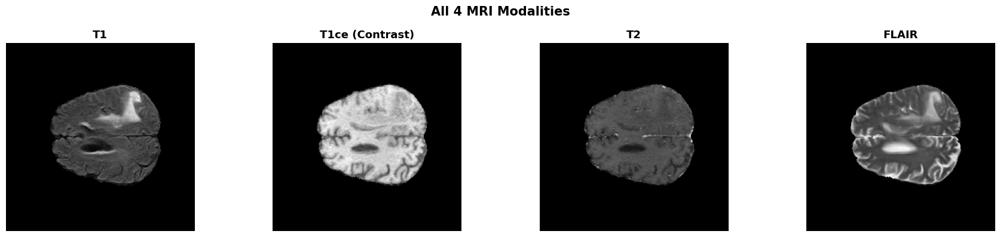

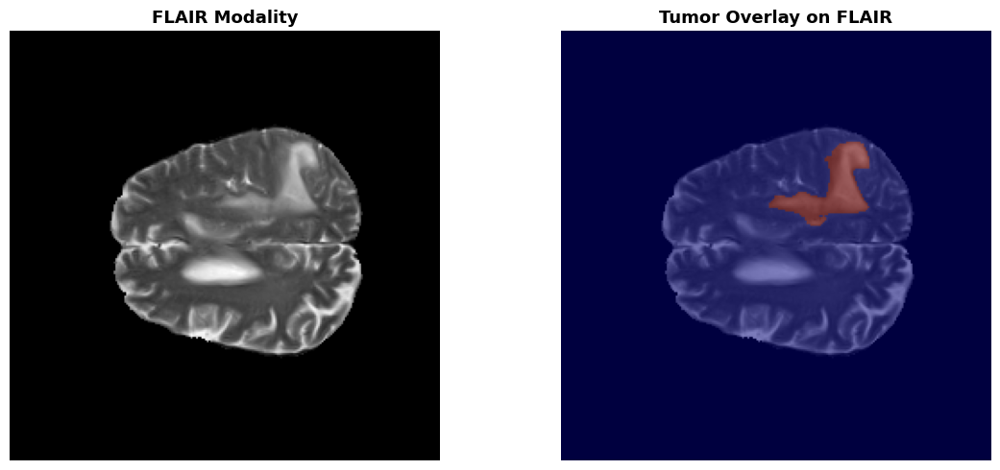

In [7]:
# ── SECTION 6b: ALL 4 MRI MODALITIES + OVERLAY ───────────────────────────────
# BraTS2020 provides 4 MRI types (modalities) per patient per slice:
#   Channel 0 → T1    : basic anatomy, white/gray matter contrast
#   Channel 1 → T1ce  : T1 with contrast agent — highlights active tumor boundary
#   Channel 2 → T2    : highlights edema (fluid/swelling)
#   Channel 3 → FLAIR : suppresses normal fluid — edema stands out clearly

def show_all_modalities(file_name):
    with h5py.File(os.path.join(DATASET_PATH, file_name), "r") as hf:
        image = hf["image"][:]   # shape: (H, W, 4) — 4 modality channels
        mask  = hf["mask"][:]    # shape: (H, W, 3) — 3 tumor region channels

    titles = ["T1", "T1ce (Contrast)", "T2", "FLAIR"]
    fig, axes = plt.subplots(1, 4, figsize=(18, 4))
    # 1 row × 4 columns — one subplot per modality

    for i, (ax, title) in enumerate(zip(axes, titles)):
        ax.imshow(image[:, :, i], cmap="gray")
        # imshow displays a 2D array as an image; cmap="gray" uses grayscale colormap
        ax.set_title(title, fontsize=13, fontweight="bold")
        ax.axis("off")    # hide x/y axis tick marks for cleaner display

    fig.suptitle("All 4 MRI Modalities", fontsize=15, fontweight="bold")
    plt.tight_layout(); plt.show()

    # ── FLAIR + Tumor Overlay ─────────────────────────────────────────────────
    flair      = image[:, :, 3]                         # extract FLAIR channel
    tumor_mask = (np.sum(mask, axis=-1) > 0).astype(np.uint8)
    # sum across all 3 tumor channels; >0 means any region has tumor → binary mask

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(flair, cmap="gray")
    axes[0].set_title("FLAIR Modality", fontsize=13, fontweight="bold")
    axes[0].axis("off")

    axes[1].imshow(flair, cmap="gray")            # FLAIR as background
    axes[1].imshow(tumor_mask, cmap="jet", alpha=0.5)
    # jet colormap (rainbow) overlaid at 50% opacity so MRI is still visible
    axes[1].set_title("Tumor Overlay on FLAIR", fontsize=13, fontweight="bold")
    axes[1].axis("off")
    plt.tight_layout(); plt.show()

show_all_modalities(tumor_file)


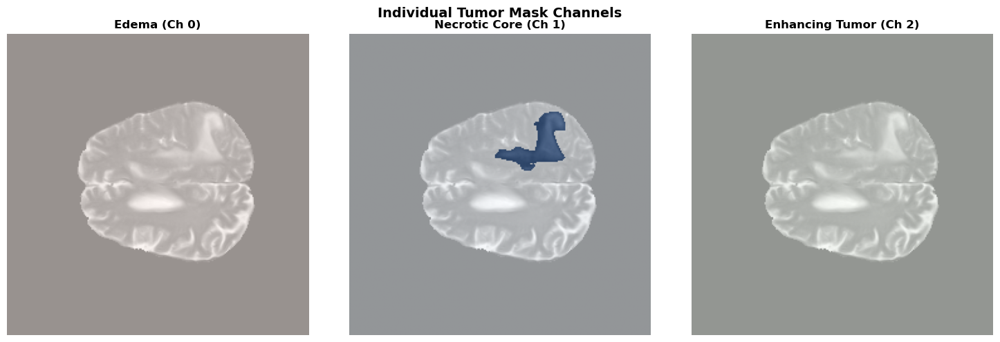

In [8]:
# ── SECTION 6c: INDIVIDUAL TUMOR MASK CHANNELS ───────────────────────────────
# The mask has 3 channels, each representing a distinct tumor sub-region:
#   Channel 0 → Peritumoral Edema    (fluid swelling surrounding the tumor)
#   Channel 1 → Necrotic Core        (dead tissue at the center of the tumor)
#   Channel 2 → Enhancing Tumor      (active, aggressive tumor visible in T1ce)
# Visualizing them separately helps understand tumor composition.

def show_tumor_channels(file_name):
    with h5py.File(os.path.join(DATASET_PATH, file_name), "r") as hf:
        image = hf["image"][:]   # MRI image for background reference
        mask  = hf["mask"][:]    # tumor mask: shape (H, W, 3)

    flair  = image[:, :, 3]      # use FLAIR as the background image
    labels = ["Edema (Ch 0)", "Necrotic Core (Ch 1)", "Enhancing Tumor (Ch 2)"]
    colors = ["Reds", "Blues", "Greens"]   # distinct colormap per region

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    for i, (ax, label, cmap) in enumerate(zip(axes, labels, colors)):
        ax.imshow(flair, cmap="gray")          # FLAIR background
        ax.imshow(mask[:, :, i], cmap=cmap, alpha=0.6)
        # alpha=0.6 makes the colored region semi-transparent
        ax.set_title(label, fontsize=12, fontweight="bold")
        ax.axis("off")

    fig.suptitle("Individual Tumor Mask Channels", fontsize=14, fontweight="bold")
    plt.tight_layout(); plt.show()

show_tumor_channels(tumor_file)


## Section 7 — Dataset Class (with Augmentation)

In [9]:
# ── SECTION 7: CUSTOM PYTORCH DATASET CLASS ──────────────────────────────────
# PyTorch requires a Dataset class to manage how individual samples are loaded.
# This class:
#   1. Scans the dataset folder and collects ONLY tumor-containing slices
#   2. Normalizes pixel intensities to [0, 1] per channel
#   3. Converts arrays to PyTorch tensors in channel-first format (C, H, W)
#   4. Optionally applies random flipping for data augmentation

class BraTSDataset(Dataset):          # inherits from PyTorch's Dataset base class
    def __init__(self, dataset_path, subset_size=2000):
        # dataset_path : folder containing all .h5 files
        # subset_size  : maximum number of tumor slices to load (caps memory usage)

        all_files = [
            os.path.join(dataset_path, f)       # full path = folder + filename
            for f in os.listdir(dataset_path)   # list all items in the folder
            if f.endswith(".h5")                # keep only HDF5 files
        ]

        tumor_files = []           # will hold only files that contain tumor
        print("Scanning for tumor slices…")

        for file in all_files:
            with h5py.File(file, "r") as hf:
                mask = hf["mask"][:]            # load tumor mask for this slice
            if np.sum(mask) > 0:               # at least one tumor pixel exists
                tumor_files.append(file)
            if len(tumor_files) >= subset_size: # stop early once we have enough
                break

        self.files = tumor_files
        print(f"Tumor slices selected: {len(self.files)}")

    def __len__(self):
        # PyTorch calls this to know the total number of samples
        return len(self.files)

    def __getitem__(self, idx):
        # PyTorch calls this to load the sample at position idx

        with h5py.File(self.files[idx], "r") as hf:
            image = hf["image"][:]   # shape: (H, W, 4) — 4 MRI modality channels
            mask  = hf["mask"][:]    # shape: (H, W, 3) — 3 tumor region channels

        # ── Preprocess image ──────────────────────────────────────────────────
        image = image.astype(np.float32)       # convert to float (required by PyTorch)
        image = np.transpose(image, (2, 0, 1)) # (H, W, 4) → (4, H, W) channel-first

        for c in range(image.shape[0]):        # normalize each channel independently
            cmin, cmax = image[c].min(), image[c].max()
            image[c] = (image[c] - cmin) / (cmax - cmin + 1e-8)
            # min-max normalization: stretches intensities to [0, 1]
            # 1e-8 prevents division by zero when a channel is completely flat

        # ── Preprocess mask ───────────────────────────────────────────────────
        mask = (np.sum(mask, axis=-1) > 0).astype(np.float32)
        # combine 3 tumor channels into one binary mask:
        #   0 = background pixel  |  1 = tumor pixel (any region)
        mask = np.expand_dims(mask, axis=0)
        # add channel dimension: (H, W) → (1, H, W) to match PyTorch convention

        return torch.tensor(image), torch.tensor(mask)
        # return (image tensor, mask tensor) pair — PyTorch DataLoader calls this


# ── AugmentedSubset wrapper ───────────────────────────────────────────────────
# Applies random horizontal/vertical flips to training data.
# Augmentation artificially enlarges the training set by creating new orientations.
class AugmentedSubset(Dataset):
    def __init__(self, subset):
        self.subset = subset           # store the underlying train subset

    def __len__(self):
        return len(self.subset)        # same length as the base subset

    def __getitem__(self, idx):
        image, mask = self.subset[idx]

        if np.random.rand() > 0.5:    # 50% chance — flip left-right
            image = torch.flip(image, dims=[2])   # flip along width axis (dim 2)
            mask  = torch.flip(mask,  dims=[2])

        if np.random.rand() > 0.5:    # 50% chance — flip top-bottom
            image = torch.flip(image, dims=[1])   # flip along height axis (dim 1)
            mask  = torch.flip(mask,  dims=[1])

        return image, mask


## Section 8 — Train / Validation DataLoaders

In [10]:
# ── SECTION 8: TRAIN / VALIDATION DATALOADERS ────────────────────────────────
# We split the dataset into training (85%) and validation (15%) sets,
# then wrap them in DataLoaders that handle batching and shuffling automatically.

SUBSET_SIZE = 1500   # number of tumor slices to use (increase for better accuracy)
BATCH_SIZE  = 8      # number of images processed together in one forward pass
VAL_SPLIT   = 0.15   # fraction of data reserved for validation

full_dataset = BraTSDataset(DATASET_PATH, subset_size=SUBSET_SIZE)
# creates the dataset — scans files and keeps SUBSET_SIZE tumor slices

val_size   = int(len(full_dataset) * VAL_SPLIT)   # e.g. 0.15 × 1500 = 225
train_size = len(full_dataset) - val_size          # remaining: e.g. 1275

train_dataset, val_dataset = random_split(full_dataset, [train_size, val_size])
# random_split shuffles once and creates two non-overlapping subsets

train_loader = DataLoader(
    AugmentedSubset(train_dataset),   # apply random flips to training data
    batch_size=BATCH_SIZE,
    shuffle=True,      # shuffle order every epoch so model doesn't memorize sequence
    num_workers=0      # load data in the main process (safest for Windows/limited RAM)
)

val_loader = DataLoader(
    val_dataset,       # no augmentation for validation — we want consistent evaluation
    batch_size=BATCH_SIZE,
    shuffle=False,     # no shuffle needed for validation
    num_workers=0
)

print(f"Train samples : {train_size}")
print(f"Val   samples : {val_size}")
print(f"Train batches : {len(train_loader)}")
print(f"Val   batches : {len(val_loader)}")


Scanning for tumor slices…
Tumor slices selected: 1500
Train samples : 1275
Val   samples : 225
Train batches : 160
Val   batches : 29


## Section 9 — UNet Architecture

In [11]:
# ── SECTION 9: UNET ARCHITECTURE ─────────────────────────────────────────────
# UNet is the gold-standard architecture for medical image segmentation.
# Structure:
#   Encoder (left)  → downsamples image, extracts features (like a zoom-out)
#   Bottleneck      → deepest layer, captures global context
#   Decoder (right) → upsamples back to original size, recovers spatial detail
#   Skip connections → copy encoder features directly to decoder at each level
#                      so fine details aren't lost during downsampling

class DoubleConv(nn.Module):
    # Reusable block: [Conv → BatchNorm → ReLU] × 2 + optional Dropout
    def __init__(self, in_ch, out_ch, dropout=0.0):
        # in_ch   : number of input feature channels
        # out_ch  : number of output feature channels
        # dropout : probability of zeroing a channel (0.0 = disabled)
        super().__init__()
        layers = [
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
            # Conv2d: 2D convolution with 3×3 kernel; padding=1 keeps spatial size unchanged
            nn.BatchNorm2d(out_ch),
            # BatchNorm2d: normalizes activations per channel — stabilizes training
            nn.ReLU(inplace=True),
            # ReLU: sets negatives to 0, introduces non-linearity (inplace saves memory)
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        ]
        if dropout > 0:
            layers.append(nn.Dropout2d(dropout))
            # Dropout2d: randomly zeros entire feature maps — reduces overfitting

        self.conv = nn.Sequential(*layers)   # chain all layers into a single module

    def forward(self, x):
        return self.conv(x)   # pass input through the entire chain


class UNet(nn.Module):
    def __init__(self, in_channels=4):
        # in_channels=4 because BraTS provides T1, T1ce, T2, FLAIR
        super().__init__()

        # ── Encoder (Downsampling Path) ───────────────────────────────────────
        self.down1 = DoubleConv(in_channels, 64)   # 4  → 64  feature maps
        self.pool1 = nn.MaxPool2d(2)               # spatial size: 240 → 120
        self.down2 = DoubleConv(64, 128)           # 64 → 128
        self.pool2 = nn.MaxPool2d(2)               # 120 → 60
        self.down3 = DoubleConv(128, 256)          # 128 → 256
        self.pool3 = nn.MaxPool2d(2)               # 60 → 30
        # MaxPool2d(2): divides each spatial dimension by 2 → halves resolution

        # ── Bottleneck ────────────────────────────────────────────────────────
        self.middle = DoubleConv(256, 512, dropout=0.3)
        # Deepest layer: 256 → 512 feature maps; dropout adds regularization here

        # ── Decoder (Upsampling Path) ─────────────────────────────────────────
        self.up3   = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        # ConvTranspose2d: learnable upsampling — doubles the spatial size: 30 → 60
        self.conv3 = DoubleConv(512, 256)
        # input is 256 (from up3) + 256 (skip from down3) = 512 channels concatenated

        self.up2   = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)  # 60 → 120
        self.conv2 = DoubleConv(256, 128)   # 128 + 128 skip = 256 input

        self.up1   = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)   # 120 → 240
        self.conv1 = DoubleConv(128, 64)    # 64 + 64 skip = 128 input

        self.final = nn.Conv2d(64, 1, kernel_size=1)
        # 1×1 convolution: collapses 64 feature maps to 1 tumor probability map

    def forward(self, x):
        # Encoder
        d1 = self.down1(x);  p1 = self.pool1(d1)   # level 1: extract features + pool
        d2 = self.down2(p1); p2 = self.pool2(d2)   # level 2
        d3 = self.down3(p2); p3 = self.pool3(d3)   # level 3

        # Bottleneck
        mid = self.middle(p3)

        # Decoder — each step: upsample + concatenate skip + double conv
        c3 = self.conv3(torch.cat([self.up3(mid), d3], dim=1))
        # torch.cat([...], dim=1): concatenate along channel dimension (skip connection)
        c2 = self.conv2(torch.cat([self.up2(c3),  d2], dim=1))
        c1 = self.conv1(torch.cat([self.up1(c2),  d1], dim=1))

        return torch.sigmoid(self.final(c1))
        # sigmoid maps each pixel's output to [0, 1] — treated as tumor probability


model = UNet(in_channels=4).to(device)
# move the model to GPU (if available) or CPU — same device as training data
total_params     = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total parameters    : {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
# p.numel() = number of scalar values in a parameter tensor


Total parameters    : 7,703,553
Trainable parameters: 7,703,553


## Section 10 — Model Summary

In [12]:
# ── SECTION 10: MODEL SUMMARY ────────────────────────────────────────────────
# torchsummary prints a Keras-style layer table: layer name, output shape, params.
# Input shape (4, 240, 240) = 4 modalities × 240×240 pixels per BraTS slice.

try:
    from torchsummary import summary
    summary(model, input_size=(4, 240, 240))
    # input_size: (channels, height, width) — does NOT include the batch dimension
except ImportError:
    # gracefully fall back if torchsummary is not installed
    print("torchsummary not installed. Run: pip install torchsummary")
    print(f"Fallback — Total parameters: {sum(p.numel() for p in model.parameters()):,}")


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 240, 240]           2,368
       BatchNorm2d-2         [-1, 64, 240, 240]             128
              ReLU-3         [-1, 64, 240, 240]               0
            Conv2d-4         [-1, 64, 240, 240]          36,928
       BatchNorm2d-5         [-1, 64, 240, 240]             128
              ReLU-6         [-1, 64, 240, 240]               0
        DoubleConv-7         [-1, 64, 240, 240]               0
         MaxPool2d-8         [-1, 64, 120, 120]               0
            Conv2d-9        [-1, 128, 120, 120]          73,856
      BatchNorm2d-10        [-1, 128, 120, 120]             256
             ReLU-11        [-1, 128, 120, 120]               0
           Conv2d-12        [-1, 128, 120, 120]         147,584
      BatchNorm2d-13        [-1, 128, 120, 120]             256
             ReLU-14        [-1, 128, 1

## Section 11 — Loss Functions + Optimizer + Scheduler

In [13]:
# ── SECTION 11: LOSS FUNCTIONS + OPTIMIZER + SCHEDULER ───────────────────────

# ── Dice Loss ─────────────────────────────────────────────────────────────────
def dice_loss(pred, target, smooth=1e-6):
    # Dice Loss penalizes lack of overlap between predicted and actual tumor masks.
    # It handles class imbalance well — tumor pixels are rare vs background.
    # pred  : model output tensor (sigmoid probabilities, shape: B×1×H×W)
    # target: ground truth binary mask tensor (same shape)
    # smooth: tiny constant to prevent division by zero

    p, t = pred.view(-1), target.view(-1)
    # .view(-1): flatten any-shape tensor to 1D for element-wise math

    intersection = (p * t).sum()
    # intersection: sum of (predicted probability × ground truth) over all pixels
    # High when prediction and ground truth both have high values at the same pixels

    dice_score = (2. * intersection + smooth) / (p.sum() + t.sum() + smooth)
    # Dice formula: 2|A∩B| / (|A| + |B|)   ranges from 0 (no overlap) to 1 (perfect)
    return 1 - dice_score
    # Dice LOSS = 1 − Dice Score (we minimise loss, so we want this near 0)


# ── Combined Loss = Dice + BCE ────────────────────────────────────────────────
def combined_loss(pred, target):
    # Combining Dice Loss and Binary Cross-Entropy (BCE) gives better results than either alone:
    # • BCE is great for per-pixel classification accuracy
    # • Dice handles the severe imbalance (99% background vs 1% tumor)
    bce = F.binary_cross_entropy(pred, target)
    # F.binary_cross_entropy: measures how well each pixel probability matches 0 or 1
    return 0.5 * dice_loss(pred, target) + 0.5 * bce
    # equal weighting (0.5 + 0.5) — can be tuned based on performance


# ── Adam Optimizer ────────────────────────────────────────────────────────────
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)
# Adam: adapts the learning rate per parameter using first and second moment estimates
# lr=1e-4      : initial learning rate (0.0001) — how big each gradient update step is
# weight_decay : L2 regularization — lightly penalizes large weights to prevent overfitting

# ── Learning Rate Scheduler ───────────────────────────────────────────────────
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",     # monitor the validation loss (lower is better)
    factor=0.5,     # multiply LR by 0.5 when triggered: e.g. 1e-4 → 5e-5
    patience=3      # wait 3 epochs without improvement before reducing LR
)
# ReduceLROnPlateau: automatically halves the learning rate when progress stalls
# This helps the model break through local minima and keep improving

print("Loss functions : Dice + BCE (combined)")
print("Optimizer      : Adam  (lr=1e-4, weight_decay=1e-5)")
print("Scheduler      : ReduceLROnPlateau (factor=0.5, patience=3)")


Loss functions : Dice + BCE (combined)
Optimizer      : Adam  (lr=1e-4, weight_decay=1e-5)
Scheduler      : ReduceLROnPlateau (factor=0.5, patience=3)


## Section 12 — Training Loop (Early Stopping + Checkpointing)

In [14]:
# ── SECTION 12: TRAINING LOOP ─────────────────────────────────────────────────
# One EPOCH = one complete pass through all training batches.
# The model sees every training sample once per epoch.
# After each epoch, we evaluate on the validation set (never used for training).
# Early stopping prevents wasted computation when the model stops improving.

EPOCHS   = 20   # maximum number of epochs to train
PATIENCE = 5    # stop early if val loss doesn't improve for 5 consecutive epochs

best_val_loss = float("inf")   # best val loss seen so far (starts at +∞)
patience_ctr  = 0              # counts consecutive epochs without improvement

# Lists to record metrics each epoch — used for plotting later
train_losses = []   # training combined loss per epoch
val_losses   = []   # validation combined loss per epoch
train_dices  = []   # training Dice score per epoch
val_dices    = []   # validation Dice score per epoch


def batch_dice(pred, target, smooth=1e-6):
    # Compute Dice score for a batch — used for logging, not backprop.
    p = (pred > 0.5).float().view(-1)   # threshold sigmoid output → binary; flatten
    t = target.view(-1)
    return float((2. * (p * t).sum() + smooth) / (p.sum() + t.sum() + smooth))


for epoch in range(EPOCHS):

    # ── Training Phase ─────────────────────────────────────────────────────────
    model.train()   # enables Dropout + BatchNorm parameter updates
    total_train      = 0.0
    epoch_train_dice = []

    for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS} [Train]"):
        images, masks = images.to(device), masks.to(device)
        # move tensors to GPU (or CPU) — must match the model's device

        optimizer.zero_grad()          # clear gradients accumulated from last batch
        out  = model(images)           # forward pass: UNet predicts tumor probability maps
        loss = combined_loss(out, masks)   # compute Dice + BCE loss
        loss.backward()                # backward pass: compute gradient of loss w.r.t. all weights
        optimizer.step()               # gradient descent: update all weights

        total_train      += loss.item()              # accumulate loss (convert tensor → float)
        epoch_train_dice.append(batch_dice(out.detach(), masks))
        # .detach() removes from computation graph — we only need Dice for logging

    avg_train = total_train / len(train_loader)     # average loss over all training batches
    train_losses.append(avg_train)
    train_dices.append(np.mean(epoch_train_dice))

    # ── Validation Phase ───────────────────────────────────────────────────────
    model.eval()    # disables Dropout; BatchNorm uses running stats (not batch stats)
    total_val      = 0.0
    epoch_val_dice = []

    with torch.no_grad():   # skip gradient tracking — saves memory and speeds up eval
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            out = model(images)
            total_val      += combined_loss(out, masks).item()
            epoch_val_dice.append(batch_dice(out, masks))

    avg_val = total_val / len(val_loader)
    val_losses.append(avg_val)
    val_dices.append(np.mean(epoch_val_dice))

    scheduler.step(avg_val)
    # pass validation loss to scheduler — may reduce LR if stagnating

    print(f"  Train Loss: {avg_train:.4f}  Val Loss: {avg_val:.4f}  "
          f"Train Dice: {train_dices[-1]:.4f}  Val Dice: {val_dices[-1]:.4f}")

    # ── Early Stopping & Best Model Checkpoint ─────────────────────────────────
    if avg_val < best_val_loss:         # improved!
        best_val_loss = avg_val
        torch.save(model.state_dict(), "best_unet_model.pth")
        # save the model weights whenever a new best val loss is achieved
        patience_ctr = 0
    else:
        patience_ctr += 1
        if patience_ctr >= PATIENCE:
            print(f"\nEarly stopping triggered at epoch {epoch + 1}.")
            break

print(f"\nBest Val Loss: {best_val_loss:.4f}  →  saved as best_unet_model.pth")

epochs_range = range(1, len(train_losses) + 1)
# integer range for x-axis of all epoch-level plots


Epoch 1/20 [Train]: 100%|████████████████████████████████████████████████████████████| 160/160 [02:55<00:00,  1.10s/it]


  Train Loss: 0.6236  Val Loss: 0.5646  Train Dice: 0.7608  Val Dice: 0.8140


Epoch 2/20 [Train]: 100%|████████████████████████████████████████████████████████████| 160/160 [02:53<00:00,  1.09s/it]


  Train Loss: 0.5340  Val Loss: 0.5075  Train Dice: 0.8560  Val Dice: 0.8900


Epoch 3/20 [Train]: 100%|████████████████████████████████████████████████████████████| 160/160 [02:53<00:00,  1.08s/it]


  Train Loss: 0.4838  Val Loss: 0.4644  Train Dice: 0.8709  Val Dice: 0.8661


Epoch 4/20 [Train]: 100%|████████████████████████████████████████████████████████████| 160/160 [02:53<00:00,  1.08s/it]


  Train Loss: 0.4363  Val Loss: 0.4125  Train Dice: 0.8824  Val Dice: 0.8948


Epoch 5/20 [Train]: 100%|████████████████████████████████████████████████████████████| 160/160 [02:53<00:00,  1.09s/it]


  Train Loss: 0.3870  Val Loss: 0.3640  Train Dice: 0.8877  Val Dice: 0.8968


Epoch 6/20 [Train]: 100%|████████████████████████████████████████████████████████████| 160/160 [02:54<00:00,  1.09s/it]


  Train Loss: 0.3331  Val Loss: 0.2996  Train Dice: 0.8987  Val Dice: 0.9306


Epoch 7/20 [Train]: 100%|████████████████████████████████████████████████████████████| 160/160 [02:54<00:00,  1.09s/it]


  Train Loss: 0.2822  Val Loss: 0.2690  Train Dice: 0.8987  Val Dice: 0.8640


Epoch 8/20 [Train]: 100%|████████████████████████████████████████████████████████████| 160/160 [02:54<00:00,  1.09s/it]


  Train Loss: 0.2274  Val Loss: 0.2021  Train Dice: 0.9145  Val Dice: 0.9286


Epoch 9/20 [Train]: 100%|████████████████████████████████████████████████████████████| 160/160 [02:54<00:00,  1.09s/it]


  Train Loss: 0.1857  Val Loss: 0.1698  Train Dice: 0.9151  Val Dice: 0.9292


Epoch 10/20 [Train]: 100%|███████████████████████████████████████████████████████████| 160/160 [02:54<00:00,  1.09s/it]


  Train Loss: 0.1496  Val Loss: 0.1340  Train Dice: 0.9227  Val Dice: 0.9254


Epoch 11/20 [Train]: 100%|███████████████████████████████████████████████████████████| 160/160 [02:54<00:00,  1.09s/it]


  Train Loss: 0.1291  Val Loss: 0.1066  Train Dice: 0.9166  Val Dice: 0.9332


Epoch 12/20 [Train]: 100%|███████████████████████████████████████████████████████████| 160/160 [02:54<00:00,  1.09s/it]


  Train Loss: 0.1046  Val Loss: 0.1403  Train Dice: 0.9259  Val Dice: 0.8279


Epoch 13/20 [Train]: 100%|███████████████████████████████████████████████████████████| 160/160 [02:54<00:00,  1.09s/it]


  Train Loss: 0.0887  Val Loss: 0.0866  Train Dice: 0.9283  Val Dice: 0.9303


Epoch 14/20 [Train]: 100%|███████████████████████████████████████████████████████████| 160/160 [02:55<00:00,  1.09s/it]


  Train Loss: 0.0787  Val Loss: 0.0719  Train Dice: 0.9304  Val Dice: 0.9385


Epoch 15/20 [Train]: 100%|███████████████████████████████████████████████████████████| 160/160 [02:53<00:00,  1.09s/it]


  Train Loss: 0.0703  Val Loss: 0.0674  Train Dice: 0.9324  Val Dice: 0.9394


Epoch 16/20 [Train]: 100%|███████████████████████████████████████████████████████████| 160/160 [02:53<00:00,  1.08s/it]


  Train Loss: 0.0655  Val Loss: 0.0582  Train Dice: 0.9319  Val Dice: 0.9445


Epoch 17/20 [Train]: 100%|███████████████████████████████████████████████████████████| 160/160 [02:53<00:00,  1.08s/it]


  Train Loss: 0.0591  Val Loss: 0.0612  Train Dice: 0.9352  Val Dice: 0.9300


Epoch 18/20 [Train]: 100%|███████████████████████████████████████████████████████████| 160/160 [02:54<00:00,  1.09s/it]


  Train Loss: 0.0550  Val Loss: 0.0548  Train Dice: 0.9370  Val Dice: 0.9384


Epoch 19/20 [Train]: 100%|███████████████████████████████████████████████████████████| 160/160 [02:55<00:00,  1.09s/it]


  Train Loss: 0.0545  Val Loss: 0.0468  Train Dice: 0.9330  Val Dice: 0.9451


Epoch 20/20 [Train]: 100%|███████████████████████████████████████████████████████████| 160/160 [02:53<00:00,  1.09s/it]


  Train Loss: 0.0502  Val Loss: 0.0499  Train Dice: 0.9372  Val Dice: 0.9415

Best Val Loss: 0.0468  →  saved as best_unet_model.pth


## Section 13 — Evaluation + Metrics Collection

In [15]:
# ── SECTION 13: EVALUATION + METRICS COLLECTION ──────────────────────────────
# Load the best saved checkpoint and evaluate on the full validation set.
# We collect raw probabilities and per-slice metrics for use in all graphs.

model.load_state_dict(torch.load("best_unet_model.pth", map_location=device))
# restore the weights from the checkpoint that achieved the lowest val loss
model.eval()   # evaluation mode: no dropout, frozen batch norm

# Flat lists — accumulate pixel values across the entire validation set
all_preds_flat  = []   # raw sigmoid probabilities (for ROC curve)
all_masks_flat  = []   # ground truth binary labels

# Per-slice score lists
all_dice_scores = []
all_iou_scores  = []
all_prec_scores = []
all_rec_scores  = []
all_acc_scores  = []
smooth = 1e-6   # prevents division by zero in all metric formulas

with torch.no_grad():
    for images, masks in val_loader:
        images, masks = images.to(device), masks.to(device)
        preds = model(images)   # forward pass

        for pred, mask in zip(preds, masks):   # process each sample individually
            p_np = pred.squeeze().cpu().numpy()   # (1,H,W) → (H,W) → numpy
            m_np = mask.squeeze().cpu().numpy()

            all_preds_flat.extend(p_np.flatten().tolist())
            all_masks_flat.extend(m_np.flatten().tolist())

            p_bin = (p_np > 0.5).astype(np.float32)   # threshold: prob > 0.5 = tumor
            TP = (p_bin * m_np).sum()                  # true positives
            TN = ((1 - p_bin) * (1 - m_np)).sum()     # true negatives
            FP = (p_bin * (1 - m_np)).sum()            # false positives (false alarms)
            FN = ((1 - p_bin) * m_np).sum()            # false negatives (missed tumors)

            all_dice_scores.append(float((2*TP + smooth) / (2*TP + FP + FN + smooth)))
            all_iou_scores.append( float((TP + smooth)   / (TP + FP + FN + smooth)))
            all_prec_scores.append(float((TP + smooth)   / (TP + FP + smooth)))
            all_rec_scores.append( float((TP + smooth)   / (TP + FN + smooth)))
            all_acc_scores.append( float((TP + TN + smooth) / (TP + TN + FP + FN + smooth)))

avg_metrics = {
    "Accuracy" : np.mean(all_acc_scores),
    "Precision": np.mean(all_prec_scores),
    "Recall"   : np.mean(all_rec_scores),
    "IoU"      : np.mean(all_iou_scores),
    "Dice"     : np.mean(all_dice_scores),
}

print("\n===== VALIDATION METRICS =====")
for k, v in avg_metrics.items():
    print(f"  {k:12s}: {v:.4f}")



===== VALIDATION METRICS =====
  Accuracy    : 0.9979
  Precision   : 0.8981
  Recall      : 0.8267
  IoU         : 0.7699
  Dice        : 0.8314


## Section 14 — Graphs 1–12


📊 Graph 1 — Loss Curve


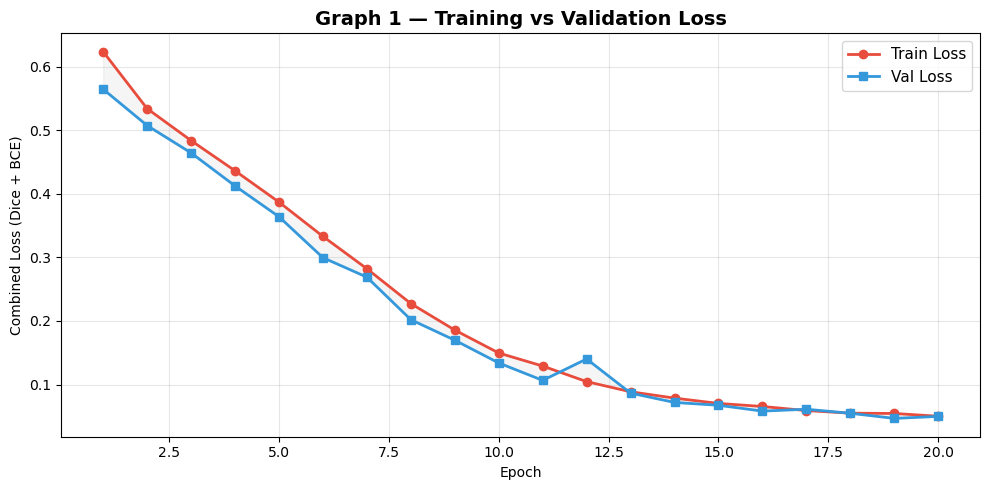

In [16]:
# ── GRAPH 1: Training vs Validation Loss Curve ───────────────────────────────
print("\n📊 Graph 1 — Loss Curve")
plt.figure(figsize=(10, 5))
plt.plot(epochs_range, train_losses, marker="o", linewidth=2, color="#E74C3C", label="Train Loss")
plt.plot(epochs_range, val_losses,   marker="s", linewidth=2, color="#3498DB", label="Val Loss")
plt.fill_between(epochs_range, train_losses, val_losses, alpha=0.08, color="gray")
# fill_between: shades the gap between train/val curves — larger gap = more overfitting
plt.title("Graph 1 — Training vs Validation Loss", fontsize=14, fontweight="bold")
plt.xlabel("Epoch"); plt.ylabel("Combined Loss (Dice + BCE)")
plt.legend(fontsize=11); plt.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()


📊 Graph 2 — Dice Score Curve


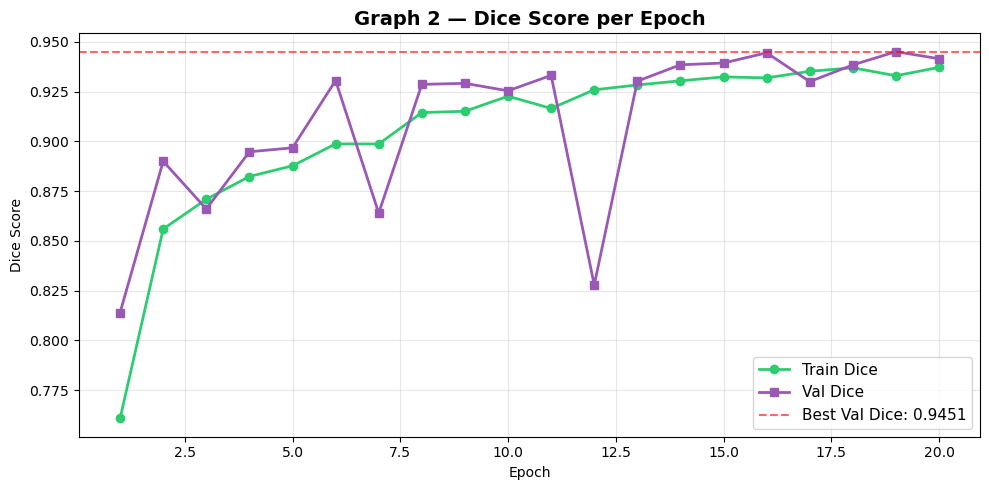

In [17]:
# ── GRAPH 2: Dice Score Curve ─────────────────────────────────────────────────
print("📊 Graph 2 — Dice Score Curve")
plt.figure(figsize=(10, 5))
plt.plot(epochs_range, train_dices, marker="o", linewidth=2, color="#2ECC71", label="Train Dice")
plt.plot(epochs_range, val_dices,   marker="s", linewidth=2, color="#9B59B6", label="Val Dice")
plt.axhline(y=max(val_dices), color="red", linestyle="--", alpha=0.6,
            label=f"Best Val Dice: {max(val_dices):.4f}")
# axhline: draws a horizontal reference line at the peak Dice score
plt.title("Graph 2 — Dice Score per Epoch", fontsize=14, fontweight="bold")
plt.xlabel("Epoch"); plt.ylabel("Dice Score")
plt.legend(fontsize=11); plt.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()


📊 Graph 3 — Metrics Dashboard


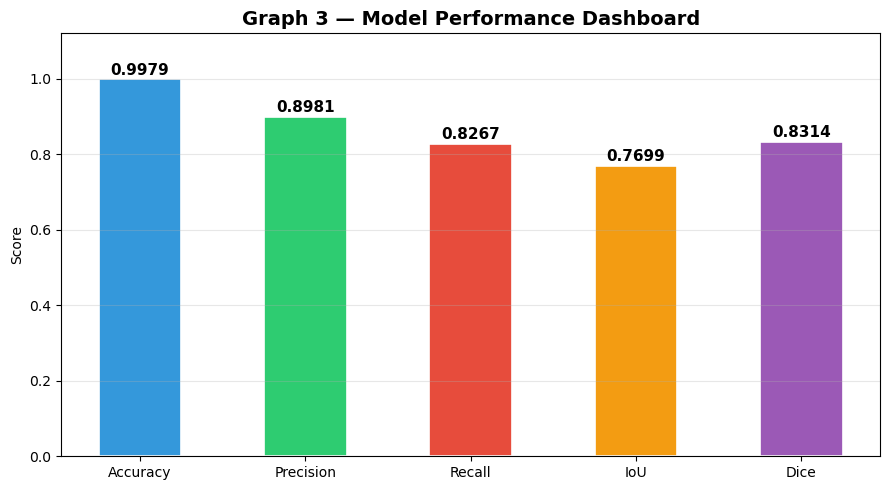

In [18]:
# ── GRAPH 3: Metrics Dashboard (Bar Chart) ────────────────────────────────────
print("📊 Graph 3 — Metrics Dashboard")
colors = ["#3498DB", "#2ECC71", "#E74C3C", "#F39C12", "#9B59B6"]
plt.figure(figsize=(9, 5))
bars = plt.bar(avg_metrics.keys(), avg_metrics.values(),
               color=colors, edgecolor="white", linewidth=1.2, width=0.5)

for bar, val in zip(bars, avg_metrics.values()):
    plt.text(bar.get_x() + bar.get_width() / 2,   # centered horizontally
             bar.get_height() + 0.005,             # just above bar top
             f"{val:.4f}", ha="center", va="bottom", fontsize=11, fontweight="bold")

plt.ylim(0, 1.12)   # leave room above bars for the value labels
plt.title("Graph 3 — Model Performance Dashboard", fontsize=14, fontweight="bold")
plt.ylabel("Score"); plt.grid(axis="y", alpha=0.3)
plt.tight_layout(); plt.show()


📊 Graph 4 — ROC Curve


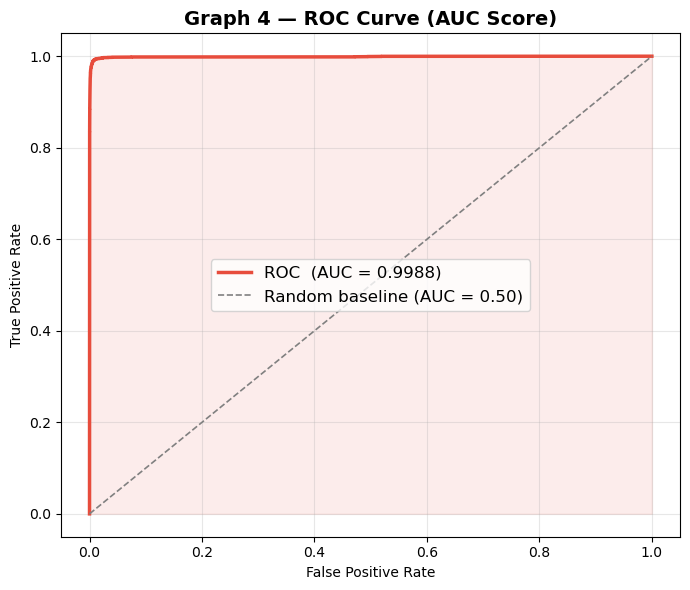

AUC: 0.9988


In [19]:
# ── GRAPH 4: ROC Curve ────────────────────────────────────────────────────────
print("📊 Graph 4 — ROC Curve")
# Subsample for speed: computing ROC on millions of pixels is slow
sample_size  = min(200_000, len(all_preds_flat))
idx_sample   = np.random.choice(len(all_preds_flat), sample_size, replace=False)
preds_sample = np.array(all_preds_flat)[idx_sample]   # raw probabilities
masks_sample = np.array(all_masks_flat)[idx_sample]   # ground truth labels

fpr, tpr, _ = roc_curve(masks_sample.astype(int), preds_sample)
# fpr (False Positive Rate): fraction of background pixels wrongly called tumor
# tpr (True Positive Rate / Sensitivity): fraction of real tumor pixels correctly detected
roc_auc = auc(fpr, tpr)   # area under the curve: 1.0 = perfect, 0.5 = random

plt.figure(figsize=(7, 6))
plt.plot(fpr, tpr, color="#E74C3C", linewidth=2.5, label=f"ROC  (AUC = {roc_auc:.4f})")
plt.plot([0, 1], [0, 1], color="gray", linestyle="--", linewidth=1.2,
         label="Random baseline (AUC = 0.50)")
plt.fill_between(fpr, tpr, alpha=0.1, color="#E74C3C")
plt.title("Graph 4 — ROC Curve (AUC Score)", fontsize=14, fontweight="bold")
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.legend(fontsize=12); plt.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()
print(f"AUC: {roc_auc:.4f}")


📊 Graph 5 — Confusion Matrix


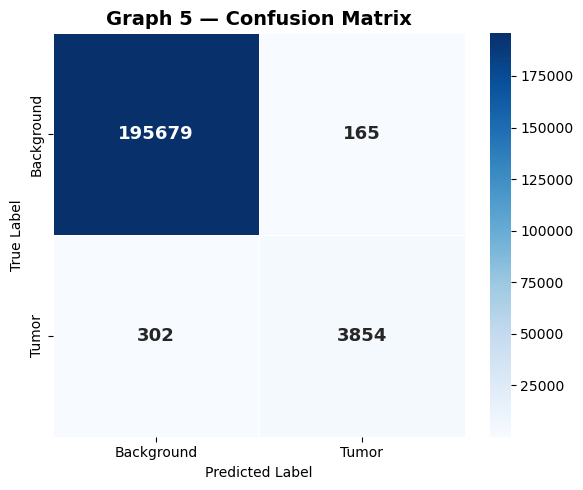

In [20]:
# ── GRAPH 5: Confusion Matrix Heatmap ────────────────────────────────────────
print("📊 Graph 5 — Confusion Matrix")
pred_labels = (preds_sample >= 0.5).astype(int)   # threshold probabilities → 0 or 1
true_labels = masks_sample.astype(int)

cm = confusion_matrix(true_labels, pred_labels)
# cm layout:  [[TN, FP],
#              [FN, TP]]
# TN: correctly predicted background   FP: background predicted as tumor (false alarm)
# FN: missed tumor (most dangerous)    TP: correctly predicted tumor

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["Background", "Tumor"],
            yticklabels=["Background", "Tumor"],
            linewidths=0.5, linecolor="white",
            annot_kws={"size": 13, "weight": "bold"})
# annot=True: write the count number inside each cell
# fmt="d":    format numbers as integers (no decimals)
plt.title("Graph 5 — Confusion Matrix", fontsize=14, fontweight="bold")
plt.xlabel("Predicted Label"); plt.ylabel("True Label")
plt.tight_layout(); plt.show()


📊 Graph 6 — Dice Score Distribution


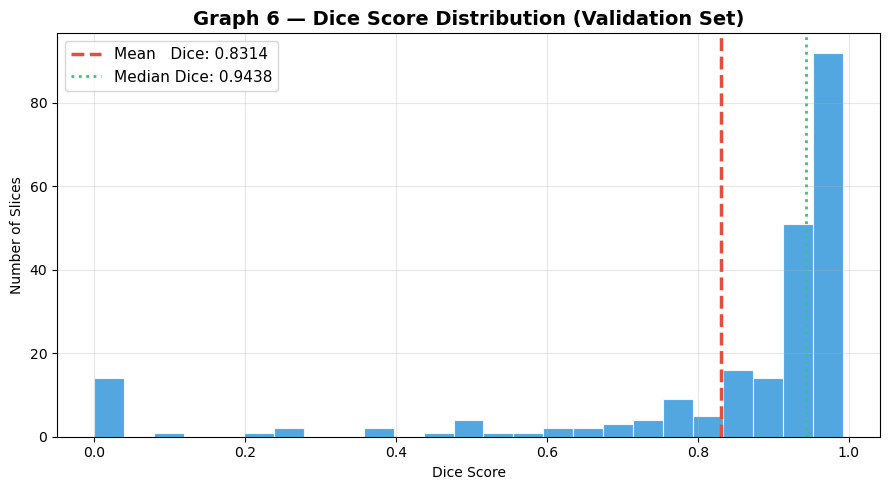

In [21]:
# ── GRAPH 6: Dice Score Distribution ─────────────────────────────────────────
print("📊 Graph 6 — Dice Score Distribution")
plt.figure(figsize=(9, 5))
plt.hist(all_dice_scores, bins=25, color="#3498DB", edgecolor="white", linewidth=0.8, alpha=0.85)
plt.axvline(np.mean(all_dice_scores),   color="#E74C3C", linewidth=2.5, linestyle="--",
            label=f"Mean   Dice: {np.mean(all_dice_scores):.4f}")
plt.axvline(np.median(all_dice_scores), color="#2ECC71", linewidth=2.0, linestyle=":",
            label=f"Median Dice: {np.median(all_dice_scores):.4f}")
# axvline: vertical reference lines showing mean and median performance
plt.title("Graph 6 — Dice Score Distribution (Validation Set)", fontsize=14, fontweight="bold")
plt.xlabel("Dice Score"); plt.ylabel("Number of Slices")
plt.legend(fontsize=11); plt.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()


📊 Graph 7 — Prediction Grid


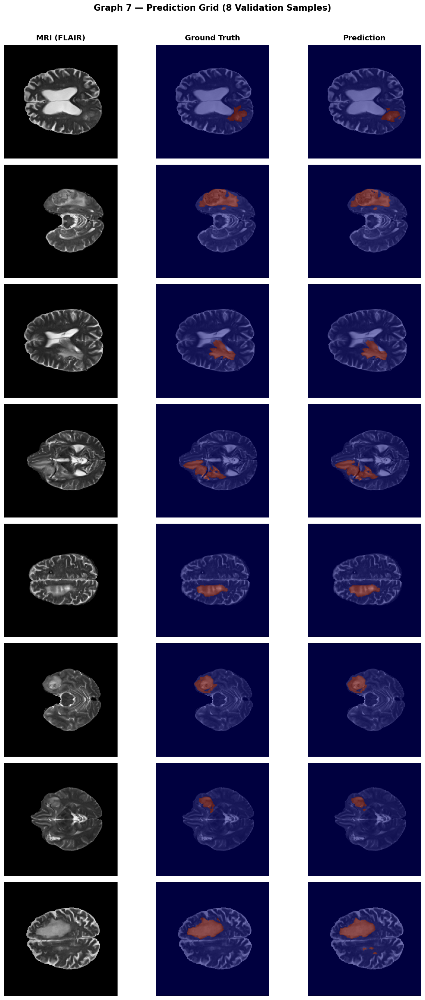

In [22]:
# ── GRAPH 7: Prediction Grid — 8 Samples ─────────────────────────────────────
print("📊 Graph 7 — Prediction Grid")
NUM_SAMPLES = 8
fig, axes = plt.subplots(NUM_SAMPLES, 3, figsize=(12, NUM_SAMPLES * 3))
# 8 rows × 3 columns: col 0 = FLAIR MRI, col 1 = ground truth, col 2 = prediction

for col, title in enumerate(["MRI (FLAIR)", "Ground Truth", "Prediction"]):
    axes[0, col].set_title(title, fontsize=13, fontweight="bold", pad=8)

count = 0
with torch.no_grad():
    for images, masks in val_loader:
        if count >= NUM_SAMPLES: break
        preds = model(images.to(device)).cpu()
        for i in range(images.shape[0]):
            if count >= NUM_SAMPLES: break
            flair   = images[i, 3].numpy()                       # FLAIR = channel index 3
            gt      = masks[i, 0].numpy()                        # ground truth mask
            pred_b  = (preds[i, 0].numpy() > 0.5).astype(np.uint8)  # binary prediction

            axes[count, 0].imshow(flair, cmap="gray")            # raw FLAIR
            axes[count, 1].imshow(flair, cmap="gray")
            axes[count, 1].imshow(gt,     cmap="jet", alpha=0.5) # GT overlay
            axes[count, 2].imshow(flair, cmap="gray")
            axes[count, 2].imshow(pred_b, cmap="jet", alpha=0.5) # prediction overlay
            for col in range(3): axes[count, col].axis("off")
            count += 1

fig.suptitle("Graph 7 — Prediction Grid (8 Validation Samples)",
             fontsize=15, fontweight="bold", y=1.01)
plt.tight_layout(); plt.show()


Graph 8 — Tumor Region Presence


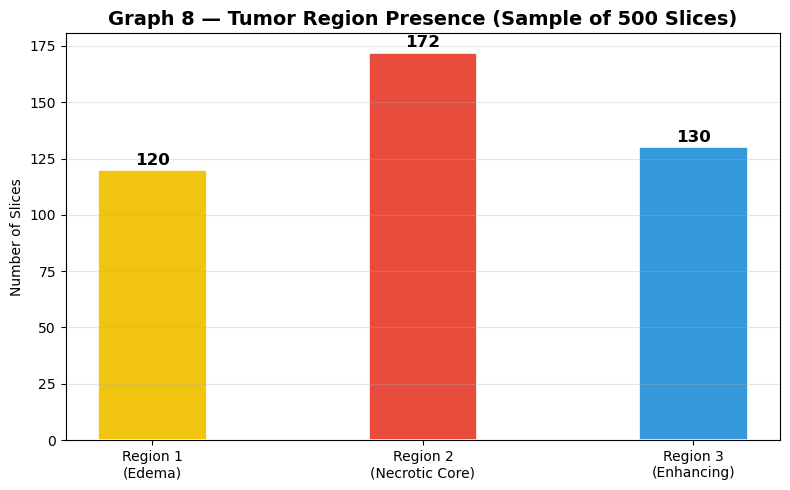

Total patients : 369
Avg tumor %    : 42.70%
   Patient_ID  Total_Slices  Tumor_Slices  Region1  Region2  Region3  \
0    volume_1           155            83       37       83       44   
1   volume_10           155            58       22       58       28   
2  volume_100           155            69       53       66       53   
3  volume_101           155            57       38       57       47   
4  volume_102           155            43       29       43       30   

   Tumor_Pct  Region1_Pct  Region2_Pct  Region3_Pct  
0      53.55        44.58       100.00        53.01  
1      37.42        37.93       100.00        48.28  
2      44.52        76.81        95.65        76.81  
3      36.77        66.67       100.00        82.46  
4      27.74        67.44       100.00        69.77  


In [23]:
# ── GRAPH 8: Tumor Region Bar Chart ──────────────────────────────────────────
print("Graph 8 — Tumor Region Presence")
r1 = r2 = r3 = 0

for f in files[:500]:   # sample 500 files for speed
    with h5py.File(os.path.join(DATASET_PATH, f), "r") as hf:
        mask = hf["mask"][:]
    if mask[:, :, 0].sum() > 0: r1 += 1   # Edema (Region 1) present in this slice
    if mask[:, :, 1].sum() > 0: r2 += 1   # Necrotic Core (Region 2)
    if mask[:, :, 2].sum() > 0: r3 += 1   # Enhancing Tumor (Region 3)

region_names  = ["Region 1\n(Edema)", "Region 2\n(Necrotic Core)", "Region 3\n(Enhancing)"]
region_counts = [r1, r2, r3]
region_colors = ["#F1C40F", "#E74C3C", "#3498DB"]

plt.figure(figsize=(8, 5))
bars = plt.bar(region_names, region_counts, color=region_colors,
               edgecolor="white", linewidth=1.2, width=0.4)
for bar, val in zip(bars, region_counts):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1,
             str(val), ha="center", va="bottom", fontsize=12, fontweight="bold")
plt.title("Graph 8 — Tumor Region Presence (Sample of 500 Slices)",
          fontsize=14, fontweight="bold")
plt.ylabel("Number of Slices"); plt.grid(axis="y", alpha=0.3)
plt.tight_layout(); plt.show()


# ── BUILD PATIENT SUMMARY DATAFRAME (used for Graphs 9, 10, 11) ───────────────
def get_all_volumes(all_files):
    # Extract all unique patient volume IDs from filenames (e.g. "volume_100")
    return sorted({
        re.search(r"(volume_\d+)", f).group(1)
        for f in all_files if re.search(r"(volume_\d+)", f)
    })

all_volumes = get_all_volumes(files)

rows = []
for vol in all_volumes:
    vol_files = [f for f in files if f.startswith(vol + "_")]
    t = ts = r1 = r2 = r3 = 0
    for f in vol_files:
        with h5py.File(os.path.join(DATASET_PATH, f), "r") as hf:
            mask = hf["mask"][:]
        t += 1
        if np.sum(mask)          > 0: ts += 1
        if mask[:, :, 0].sum()   > 0: r1 += 1
        if mask[:, :, 1].sum()   > 0: r2 += 1
        if mask[:, :, 2].sum()   > 0: r3 += 1
    rows.append([vol, t, ts, r1, r2, r3])

df = pd.DataFrame(rows, columns=["Patient_ID", "Total_Slices", "Tumor_Slices",
                                   "Region1", "Region2", "Region3"])
df["Tumor_Pct"]   = (df["Tumor_Slices"] / df["Total_Slices"] * 100).round(2)
df["Region1_Pct"] = (df["Region1"] / df["Tumor_Slices"].replace(0, np.nan) * 100).round(2)
df["Region2_Pct"] = (df["Region2"] / df["Tumor_Slices"].replace(0, np.nan) * 100).round(2)
df["Region3_Pct"] = (df["Region3"] / df["Tumor_Slices"].replace(0, np.nan) * 100).round(2)
# .replace(0, np.nan): avoids division-by-zero for patients with no tumor slices

print(f"Total patients : {len(df)}")
print(f"Avg tumor %    : {df['Tumor_Pct'].mean():.2f}%")
print(df.head())


Graph 9 — Tumor Distribution Across Patients


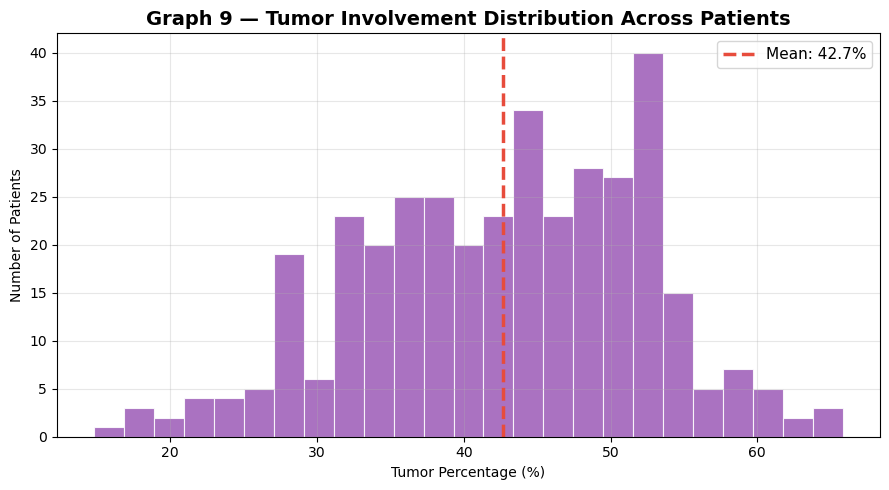

In [24]:
# ── GRAPH 9: Tumor Involvement Distribution ──────────────────────────────────
print("Graph 9 — Tumor Distribution Across Patients")
plt.figure(figsize=(9, 5))
plt.hist(df["Tumor_Pct"].dropna(), bins=25, color="#9B59B6",
         edgecolor="white", linewidth=0.8, alpha=0.85)
plt.axvline(df["Tumor_Pct"].mean(), color="#E74C3C", linewidth=2.5, linestyle="--",
            label=f"Mean: {df['Tumor_Pct'].mean():.1f}%")
plt.title("Graph 9 — Tumor Involvement Distribution Across Patients",
          fontsize=14, fontweight="bold")
plt.xlabel("Tumor Percentage (%)"); plt.ylabel("Number of Patients")
plt.legend(fontsize=11); plt.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()


Graph 10 — Top 10 Tumor Burden Patients


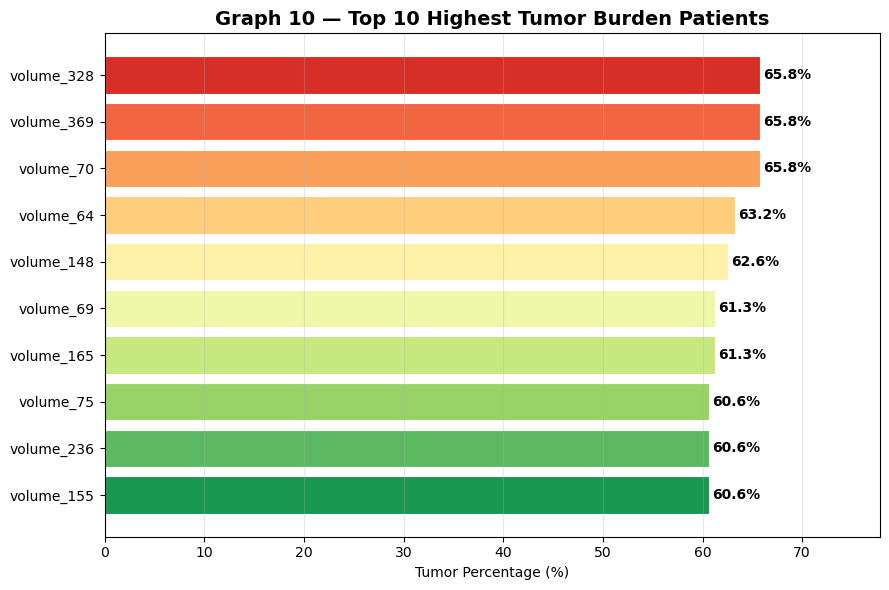

In [25]:
# ── GRAPH 10: Top 10 Highest Tumor Burden Patients ───────────────────────────
print("Graph 10 — Top 10 Tumor Burden Patients")
top10 = df.nlargest(10, "Tumor_Pct").sort_values("Tumor_Pct")
# nlargest: selects 10 rows with highest Tumor_Pct
# sort_values ascending: longest bar ends up at the bottom of the horizontal chart

bar_colors = plt.cm.RdYlGn_r(np.linspace(0.1, 0.9, len(top10)))
# RdYlGn_r reversed: green (low) → yellow (medium) → red (high burden)

plt.figure(figsize=(9, 6))
bars = plt.barh(top10["Patient_ID"], top10["Tumor_Pct"],
                color=bar_colors, edgecolor="white", linewidth=0.8)
for bar, val in zip(bars, top10["Tumor_Pct"]):
    plt.text(bar.get_width() + 0.3, bar.get_y() + bar.get_height() / 2,
             f"{val:.1f}%", va="center", fontsize=10, fontweight="bold")
plt.title("Graph 10 — Top 10 Highest Tumor Burden Patients",
          fontsize=14, fontweight="bold")
plt.xlabel("Tumor Percentage (%)")
plt.xlim(0, top10["Tumor_Pct"].max() + 12)   # extend x-axis to fit percentage labels
plt.grid(axis="x", alpha=0.3); plt.tight_layout(); plt.show()


 Graph 11 — Region-wise Pie Chart


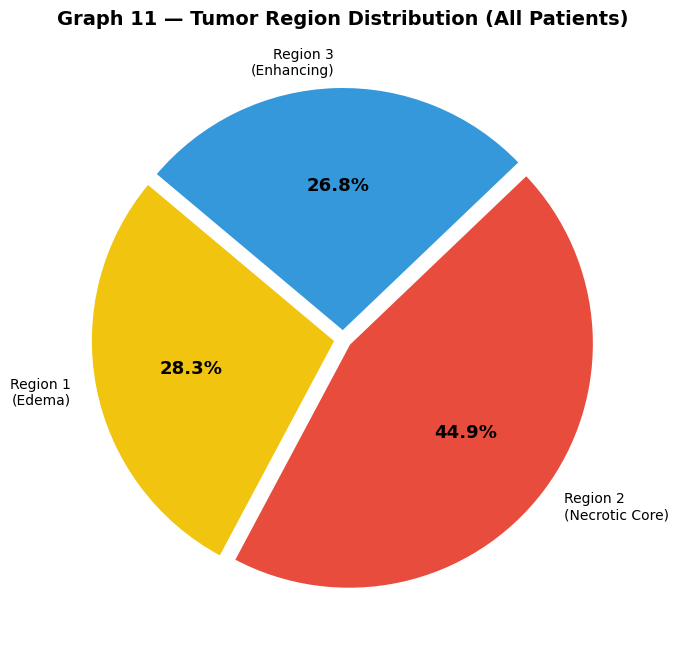

In [26]:
# ── GRAPH 11: Region-wise Pie Chart ──────────────────────────────────────────
print(" Graph 11 — Region-wise Pie Chart")
region_totals = [df["Region1"].sum(), df["Region2"].sum(), df["Region3"].sum()]
# sum of slices containing each region across the entire dataset

pie_labels = ["Region 1\n(Edema)", "Region 2\n(Necrotic Core)", "Region 3\n(Enhancing)"]
pie_colors = ["#F1C40F", "#E74C3C", "#3498DB"]

plt.figure(figsize=(7, 7))
wedges, texts, autotexts = plt.pie(
    region_totals,
    labels=pie_labels,
    colors=pie_colors,
    autopct="%1.1f%%",           # show percentage with 1 decimal inside each slice
    startangle=140,              # rotate starting angle for visual balance
    explode=(0.03, 0.03, 0.03), # slightly pull each slice away from center
    wedgeprops={"edgecolor": "white", "linewidth": 2}
)
for at in autotexts:
    at.set_fontweight("bold"); at.set_fontsize(13)

plt.title("Graph 11 — Tumor Region Distribution (All Patients)",
          fontsize=14, fontweight="bold")
plt.tight_layout(); plt.show()


In [27]:
# ── GRAPH 12: 3D Interactive Multi-Color Tumor Visualization ─────────────────
print("Graph 12 — 3D Interactive Tumor (Plotly)")

def get_volume_slices(volume_id, all_files):
    # Collect and sort all slice filenames belonging to one patient.
    vf = [f for f in all_files if volume_id in f]
    vf.sort(key=lambda x: int(re.findall(r"slice_(\d+)", x)[0]))
    # sort numerically by slice index extracted from filename
    return vf

def build_3d_volume(volume_files):
    # Stack 2D mask slices into 3D numpy arrays, one per tumor region.
    ch1, ch2, ch3 = [], [], []
    for f in volume_files:
        with h5py.File(os.path.join(DATASET_PATH, f), "r") as hf:
            mask = hf["mask"][:]        # shape: (H, W, 3)
        ch1.append(mask[:, :, 0])       # Edema
        ch2.append(mask[:, :, 1])       # Necrotic Core
        ch3.append(mask[:, :, 2])       # Enhancing Tumor
    return np.stack(ch1), np.stack(ch2), np.stack(ch3)
    # np.stack: turns a list of 2D slices into a 3D volume (Depth, H, W)

def show_3d_multicolor(ch1, ch2, ch3, title="3D Brain Tumor Segmentation"):
    # Render an interactive 3D mesh with a distinct color per tumor sub-region.
    fig = go.Figure()

    for ch, color, opacity, name in [
        (ch1, "yellow", 0.40, "Edema"),
        (ch2, "red",    0.60, "Necrotic Core"),
        (ch3, "cyan",   0.50, "Enhancing Tumor"),
    ]:
        if ch.max() == 0:
            continue   # skip empty regions — marching cubes fails on all-zero volumes

        verts, faces, _, _ = measure.marching_cubes(ch.astype(np.uint8), level=0.5)
        # marching_cubes: extracts the 3D surface mesh from the binary volume
        # verts: (N, 3) array of 3D point coordinates on the surface
        # faces: (M, 3) array of triangle indices connecting the vertices

        fig.add_trace(go.Mesh3d(
            x=verts[:, 0], y=verts[:, 1], z=verts[:, 2],
            i=faces[:, 0], j=faces[:, 1], k=faces[:, 2],
            color=color, opacity=opacity, name=name, showlegend=True
        ))

    fig.update_layout(
        title=dict(text=f"Graph 12 — {title} (Interactive)", font=dict(size=15)),
        scene=dict(
            xaxis_title="Axial",       # depth (slice index)
            yaxis_title="Coronal",     # up-down
            zaxis_title="Sagittal"     # left-right
        ),
        legend=dict(yanchor="top", y=0.95, xanchor="left", x=0.01)
    )
    fig.show()   # opens interactive plot in browser (rotatable, zoomable)

volume_slices          = get_volume_slices("volume_100", files)
ch1_3d, ch2_3d, ch3_3d = build_3d_volume(volume_slices)
show_3d_multicolor(ch1_3d, ch2_3d, ch3_3d)


Graph 12 — 3D Interactive Tumor (Plotly)


## Section 15 — Inference + Morphological Post-Processing

Inference time: 0.1867 seconds

Dice Score (cleaned prediction): 0.9537


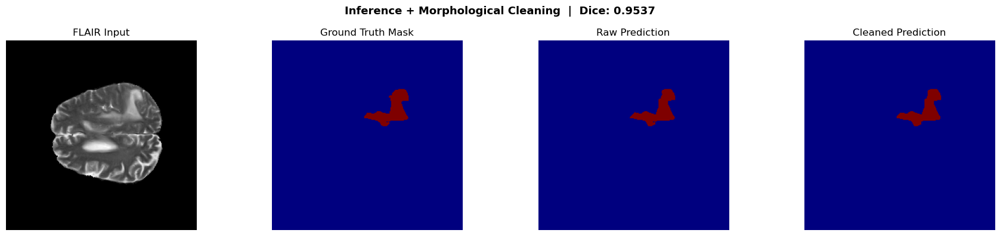


===== SINGLE SAMPLE METRICS =====
  Dice        : 0.9537
  IoU         : 0.9115
  Precision   : 0.9922
  Recall      : 0.9181
  Accuracy    : 0.9983


In [28]:
# ── SECTION 15: INFERENCE + MORPHOLOGICAL POST-PROCESSING ────────────────────
# After predicting a binary mask, we clean small noisy blobs using morphological ops:
#   Opening  (erosion → dilation): removes isolated white noise pixels (false positives)
#   Closing  (dilation → erosion): fills small holes inside the tumor region
# These operations make the final mask smoother and clinically more meaningful.

model.eval()

test_img, test_mask = full_dataset[0]    # grab one sample for demonstration
# NOTE: full_dataset[0] returns the same sample every time (deterministic)

start = time.time()
with torch.no_grad():
    input_tensor = test_img.unsqueeze(0).to(device)
    # unsqueeze(0): adds batch dimension → (4, H, W) → (1, 4, H, W)
    prediction = model(input_tensor)
end   = time.time()
print(f"Inference time: {end - start:.4f} seconds")

pred_np = prediction.squeeze().cpu().numpy()
# squeeze(): removes all size-1 dimensions → (1, 1, H, W) → (H, W)
# .cpu(): move tensor back from GPU to CPU memory
# .numpy(): convert PyTorch tensor to NumPy array for OpenCV processing

pred_binary = (pred_np > 0.5).astype(np.uint8)
# apply threshold: pixels with probability > 0.5 are predicted as tumor

# ── Morphological Cleaning ────────────────────────────────────────────────────
kernel = np.ones((3, 3), np.uint8)
# structuring element: 3×3 block of ones — defines the neighborhood for morphological ops

clean_pred = cv2.morphologyEx(pred_binary, cv2.MORPH_OPEN, kernel)
# MORPH_OPEN = erosion followed by dilation
# Erosion: shrinks white regions — removes tiny isolated noise pixels
# Dilation: expands the remaining white regions back to their original size

clean_pred = cv2.morphologyEx(clean_pred, cv2.MORPH_CLOSE, kernel)
# MORPH_CLOSE = dilation followed by erosion
# Dilation: expands white regions — bridges small gaps/holes inside tumor
# Erosion: shrinks them back — keeps overall size the same

ground_truth = test_mask.squeeze().numpy()
# ground truth mask for visual comparison

# ── Compute Final Dice Score ──────────────────────────────────────────────────
def compute_dice(pred, target, smooth=1e-6):
    pred   = pred.flatten()
    target = target.flatten()
    intersection = (pred * target).sum()
    return (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)

dice = compute_dice(clean_pred, ground_truth)
print(f"\nDice Score (cleaned prediction): {dice:.4f}")

# ── Visualize ─────────────────────────────────────────────────────────────────
flair = test_img[3].numpy()   # FLAIR channel (index 3 out of 4 modalities)

fig, axes = plt.subplots(1, 4, figsize=(18, 4))
axes[0].imshow(flair,        cmap="gray");         axes[0].set_title("FLAIR Input")
axes[1].imshow(ground_truth, cmap="jet");          axes[1].set_title("Ground Truth Mask")
axes[2].imshow(pred_binary,  cmap="jet");          axes[2].set_title("Raw Prediction")
axes[3].imshow(clean_pred,   cmap="jet");          axes[3].set_title("Cleaned Prediction")
for ax in axes: ax.axis("off")
plt.suptitle(f"Inference + Morphological Cleaning  |  Dice: {dice:.4f}",
             fontsize=13, fontweight="bold")
plt.tight_layout(); plt.show()

# ── Full Segmentation Metrics on This Sample ──────────────────────────────────
def compute_segmentation_metrics(pred, target, smooth=1e-6):
    pred   = pred.flatten(); target = target.flatten()
    TP = (pred * target).sum()
    TN = ((1 - pred) * (1 - target)).sum()
    FP = (pred * (1 - target)).sum()
    FN = ((1 - pred) * target).sum()
    return {
        "Dice"     : round(float((2*TP + smooth) / (2*TP + FP + FN + smooth)), 4),
        "IoU"      : round(float((TP + smooth)   / (TP + FP + FN + smooth)),   4),
        "Precision": round(float((TP + smooth)   / (TP + FP + smooth)),         4),
        "Recall"   : round(float((TP + smooth)   / (TP + FN + smooth)),         4),
        "Accuracy" : round(float((TP + TN + smooth) / (TP + TN + FP + FN + smooth)), 4),
    }

metrics = compute_segmentation_metrics(clean_pred.astype(np.float32),
                                       ground_truth.astype(np.float32))
print("\n===== SINGLE SAMPLE METRICS =====")
for k, v in metrics.items():
    print(f"  {k:12s}: {v}")


## Section 16 — Grad-CAM: Model Attention Visualization

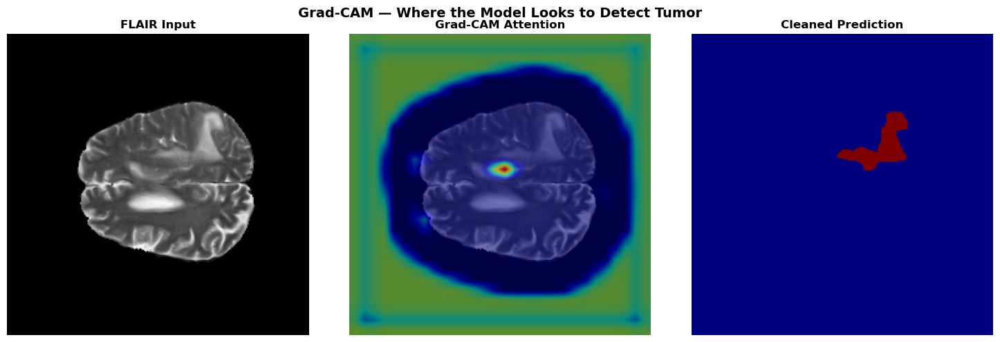

Grad-CAM hooks removed.


In [29]:
# ── SECTION 16: GRAD-CAM — MODEL ATTENTION VISUALIZATION (NEW) ───────────────
# Grad-CAM (Gradient-weighted Class Activation Mapping) shows WHICH regions
# of the MRI the model is "looking at" when making its tumor prediction.
# This is vital for medical AI — we must verify the model focuses on real anatomy.
#
# How it works:
#   1. Run a forward pass and keep the feature maps at the bottleneck layer.
#   2. Run a backward pass for the tumor prediction score.
#   3. Compute the gradient of the output w.r.t. the bottleneck feature maps.
#   4. Average the gradients → importance weights for each feature map channel.
#   5. Take a weighted sum of feature maps → saliency heatmap.

# Hook storage — will capture values during forward/backward pass
grad_cam_fmaps = {}   # stores the bottleneck feature maps (activations)
grad_cam_grads = {}   # stores the gradients flowing back through the bottleneck

def forward_hook(module, inp, out):
    grad_cam_fmaps["bottleneck"] = out   # save feature maps when forward reaches bottleneck

def backward_hook(module, grad_in, grad_out):
    grad_cam_grads["bottleneck"] = grad_out[0]   # save gradients during backprop

# Register hooks on the UNet bottleneck (middle DoubleConv block)
fwd_handle = model.middle.register_forward_hook(forward_hook)
bwd_handle = model.middle.register_full_backward_hook(backward_hook)
# register_forward_hook: called automatically after the layer runs during forward pass
# register_full_backward_hook: called automatically during the backward pass

# ── Run forward + backward for one sample ────────────────────────────────────
model.eval()
inp = test_img.unsqueeze(0).to(device)   # add batch dim → (1, 4, H, W)
inp.requires_grad_(True)                 # we need gradients w.r.t. input as well

out = model(inp)                         # forward pass — hooks fire here
tumor_pixels = out[out > 0.5]
score = tumor_pixels.sum() if len(tumor_pixels) > 0 else out.sum()       
model.zero_grad()
score.backward()                         # backward pass — backward hooks fire here

# ── Compute Grad-CAM heatmap ──────────────────────────────────────────────────
fmaps = grad_cam_fmaps["bottleneck"].detach().cpu().numpy()[0]   # (C, H', W')
grads = grad_cam_grads["bottleneck"].detach().cpu().numpy()[0]   # (C, H', W')

weights    = grads.mean(axis=(1, 2))   # global average pooling: one weight per channel
cam        = np.sum(weights[:, np.newaxis, np.newaxis] * fmaps, axis=0)
# weighted sum of feature maps: channels with larger gradients contribute more
cam        = np.maximum(cam, 0)         # ReLU: keep only positive activations
cam        = cam / (cam.max() + 1e-8)  # normalize to [0, 1]
cam_resized = cv2.resize(cam, (240, 240))
# resize the low-resolution heatmap (30×30) back to the original image size (240×240)

# ── Visualize Grad-CAM overlay ────────────────────────────────────────────────
flair_np = test_img[3].numpy()   # FLAIR modality for background

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(flair_np,   cmap="gray")
axes[0].set_title("FLAIR Input",        fontsize=12, fontweight="bold")

axes[1].imshow(flair_np,   cmap="gray")
axes[1].imshow(cam_resized, cmap="jet", alpha=0.55)
# overlay the Grad-CAM heatmap on FLAIR — red/orange = high attention, blue = low
axes[1].set_title("Grad-CAM Attention", fontsize=12, fontweight="bold")

axes[2].imshow(clean_pred, cmap="jet")
axes[2].set_title("Cleaned Prediction", fontsize=12, fontweight="bold")

for ax in axes: ax.axis("off")
plt.suptitle("Grad-CAM — Where the Model Looks to Detect Tumor",
             fontsize=14, fontweight="bold")
plt.tight_layout(); plt.show()

# Clean up hooks to prevent them from accumulating in later cells
fwd_handle.remove()
bwd_handle.remove()
print("Grad-CAM hooks removed.")


## Section 17 — Per-Patient Analysis

In [30]:
# ── SECTION 17a: PATIENT SUMMARY REPORT ──────────────────────────────────────
# Print a detailed tumor breakdown for any single patient by ID.

def patient_summary(volume_id, all_files):
    vf = [f for f in all_files if f.startswith(volume_id + "_")]
    # collect only slices belonging EXACTLY to this patient
    # startswith(volume_id + "_") prevents volume_10 matching volume_100
    vf.sort(key=lambda x: int(re.findall(r"slice_(\d+)", x)[0]))
    # sort slices numerically so we process them in anatomical (top-to-bottom) order

    total = ts = r1 = r2 = r3 = 0
    for f in vf:
        with h5py.File(os.path.join(DATASET_PATH, f), "r") as hf:
            mask = hf["mask"][:]
        total += 1
        if np.sum(mask)        > 0: ts += 1
        if mask[:, :, 0].sum() > 0: r1 += 1
        if mask[:, :, 1].sum() > 0: r2 += 1
        if mask[:, :, 2].sum() > 0: r3 += 1

    pct = lambda n: f"{round(n / ts * 100, 1)}%" if ts > 0 else "N/A"
    # inline function to compute percentage; returns "N/A" if no tumor slices exist

    print(f"\n{'='*40}")
    print(f"  PATIENT TUMOR SUMMARY")
    print(f"{'='*40}")
    print(f"  Patient ID            : {volume_id}")
    print(f"  Total Slices          : {total}")
    print(f"  Tumor Slices          : {ts}  ({round(ts/total*100,1)}% of all slices)")
    print(f"  Region 1 (Edema)      : {r1} slices  ({pct(r1)} of tumor slices)")
    print(f"  Region 2 (Necr. Core) : {r2} slices  ({pct(r2)} of tumor slices)")
    print(f"  Region 3 (Enhancing)  : {r3} slices  ({pct(r3)} of tumor slices)")
    print(f"{'='*40}")

patient_summary("volume_100", files)



  PATIENT TUMOR SUMMARY
  Patient ID            : volume_100
  Total Slices          : 155
  Tumor Slices          : 69  (44.5% of all slices)
  Region 1 (Edema)      : 53 slices  (76.8% of tumor slices)
  Region 2 (Necr. Core) : 66 slices  (95.7% of tumor slices)
  Region 3 (Enhancing)  : 53 slices  (76.8% of tumor slices)


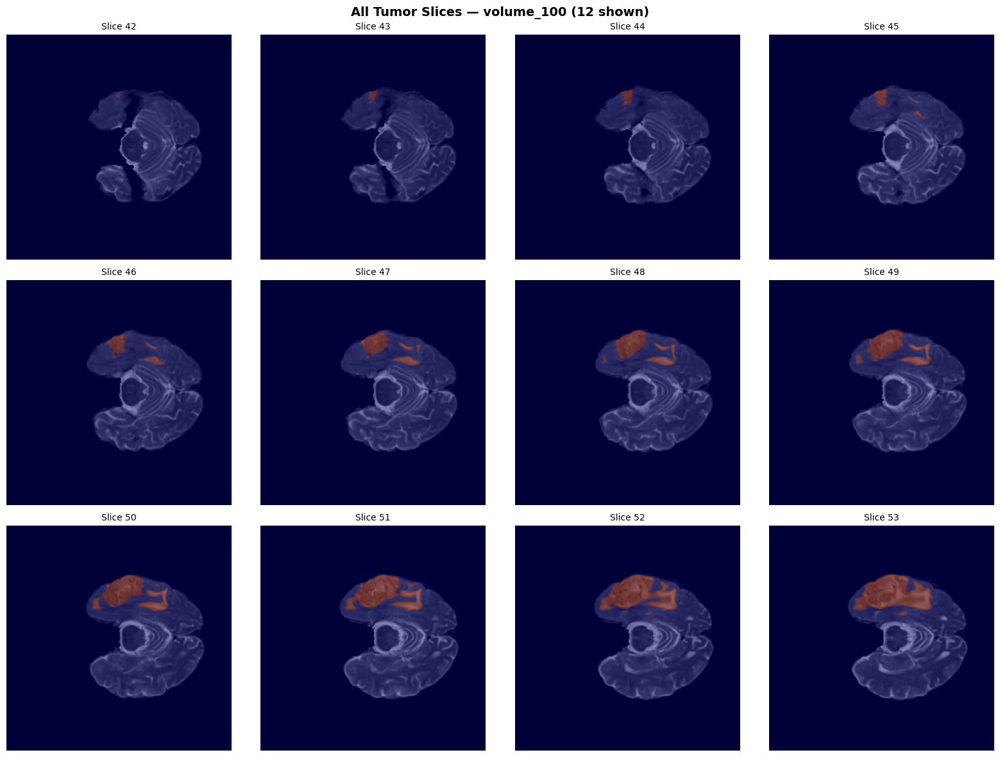

In [31]:
# ── SECTION 17b: SHOW ALL TUMOR SLICES FOR ONE PATIENT ───────────────────────
# Displays a grid of all slices that contain tumor for a chosen patient.
# Useful for clinicians to see the full axial extent of the tumor.

def show_all_tumor_slices(volume_id, max_display=12):
    vf = [f for f in files if volume_id in f]
    vf.sort(key=lambda x: int(re.findall(r"slice_(\d+)", x)[0]))

    tumor_slices = []
    for f in vf:
        with h5py.File(os.path.join(DATASET_PATH, f), "r") as hf:
            image = hf["image"][:]
            mask  = hf["mask"][:]
        if np.sum(mask) > 0:           # only keep slices with tumor
            tumor_slices.append((image, mask, f))

    n = min(len(tumor_slices), max_display)   # cap at max_display for layout
    if n == 0:
        print("No tumor slices found for this patient."); return

    cols = 4
    rows = (n + cols - 1) // cols     # ceiling division for number of rows
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    axes = axes.flatten()             # flatten to 1D for easy indexing

    for i in range(n):
        image, mask, fname = tumor_slices[i]
        flair      = image[:, :, 3]   # FLAIR channel
        tumor_mask = (np.sum(mask, axis=-1) > 0).astype(np.uint8)   # combined binary
        axes[i].imshow(flair, cmap="gray")
        axes[i].imshow(tumor_mask, cmap="jet", alpha=0.45)   # overlay
        slice_num = re.findall(r"slice_(\d+)", fname)[0]
        axes[i].set_title(f"Slice {slice_num}", fontsize=10)
        axes[i].axis("off")

    for j in range(n, len(axes)):     # hide unused subplot panels
        axes[j].axis("off")

    fig.suptitle(f"All Tumor Slices — {volume_id} ({n} shown)",
                 fontsize=14, fontweight="bold")
    plt.tight_layout(); plt.show()

show_all_tumor_slices("volume_100", max_display=12)


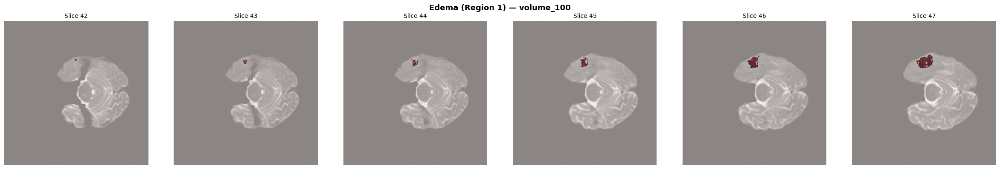

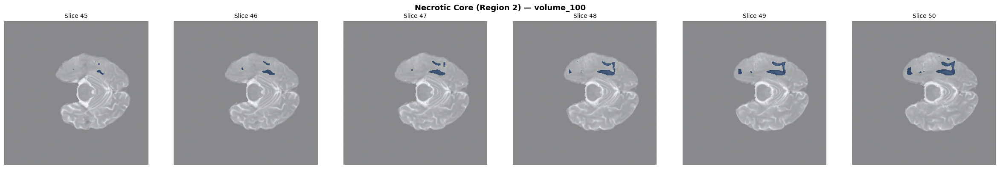

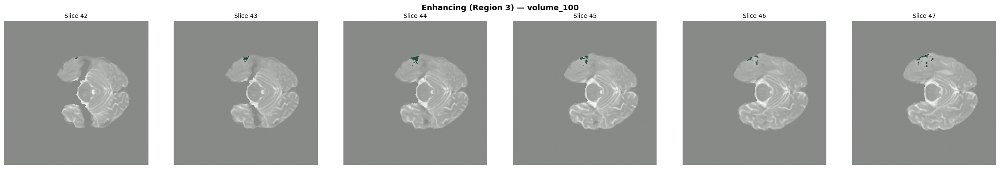

In [32]:
# ── SECTION 17c: SHOW REGION-SPECIFIC SLICE EXAMPLES ────────────────────────
# Display sample slices where a specific tumor sub-region is present.
# Helps compare how each region (Edema / Core / Enhancing) appears visually.

def show_region_examples(volume_id, region_index, max_display=6):
    # region_index: 0 = Edema, 1 = Necrotic Core, 2 = Enhancing Tumor
    region_names = ["Edema (Region 1)", "Necrotic Core (Region 2)", "Enhancing (Region 3)"]
    region_cmaps = ["Reds", "Blues", "Greens"]

    vf = [f for f in files if volume_id in f]
    vf.sort(key=lambda x: int(re.findall(r"slice_(\d+)", x)[0]))

    region_slices = []
    for f in vf:
        with h5py.File(os.path.join(DATASET_PATH, f), "r") as hf:
            image = hf["image"][:]
            mask  = hf["mask"][:]
        if mask[:, :, region_index].sum() > 0:   # this region exists in this slice
            region_slices.append((image, mask[:, :, region_index], f))

    n = min(len(region_slices), max_display)
    if n == 0:
        print(f"No slices found with {region_names[region_index]} for {volume_id}"); return

    fig, axes = plt.subplots(1, n, figsize=(n * 4, 4))
    if n == 1: axes = [axes]   # ensure axes is always a list for uniform indexing

    for i in range(n):
        image, region_mask, fname = region_slices[i]
        flair = image[:, :, 3]
        axes[i].imshow(flair, cmap="gray")
        axes[i].imshow(region_mask, cmap=region_cmaps[region_index], alpha=0.55)
        slice_num = re.findall(r"slice_(\d+)", fname)[0]
        axes[i].set_title(f"Slice {slice_num}", fontsize=10)
        axes[i].axis("off")

    fig.suptitle(f"{region_names[region_index]} — {volume_id}",
                 fontsize=13, fontweight="bold")
    plt.tight_layout(); plt.show()

show_region_examples("volume_100", region_index=0)   # Edema
show_region_examples("volume_100", region_index=1)   # Necrotic Core
show_region_examples("volume_100", region_index=2)   # Enhancing Tumor


In [33]:
# ── SECTION 17d: FIND PATIENTS WITH TUMOR ────────────────────────────────────
# Scan the dataset and identify which patients actually have tumor in their scans.
# Some subjects may be fully healthy (no tumor label in any slice).

def find_patients_with_tumor(all_volumes):
    
    tumor_patients = []
    
    for vol in all_volumes:
        
        # Get all slice files belonging to this patient
        vol_files = [f for f in files if vol in f]
        
        has_tumor = False
        
        # Scan each slice of the patient
        for f in vol_files:
            
            with h5py.File(os.path.join(DATASET_PATH, f), "r") as hf:
                
                # Check if mask contains tumor pixels
                if np.sum(hf["mask"][:]) > 0:
                    has_tumor = True
                    break   # Stop scanning once tumor is confirmed
        
        # If tumor was found in any slice, record the patient
        if has_tumor:
            tumor_patients.append(vol)
    
    return tumor_patients


# Run the function
tumor_patients = find_patients_with_tumor(all_volumes)

print(f"Total patients          : {len(all_volumes)}")
print(f"Patients with tumor     : {len(tumor_patients)}")
print(f"Patients without tumor  : {len(all_volumes) - len(tumor_patients)}")
print(f"Sample tumor patients   : {tumor_patients[:5]}")

Total patients          : 369
Patients with tumor     : 369
Patients without tumor  : 0
Sample tumor patients   : ['volume_1', 'volume_10', 'volume_100', 'volume_101', 'volume_102']


## Section 18 — Full Dataset Summary + CSV Export

In [34]:
# ── SECTION 18: FULL DATASET SUMMARY + CSV EXPORT ────────────────────────────
# The DataFrame 'df' (built in Graph 8) already contains per-patient statistics.
# Here we add derived columns, print dataset-level statistics, and export to CSV.

# ── Dataset-level Statistics ──────────────────────────────────────────────────
print("\n===== DATASET LEVEL STATISTICS =====")
print(f"  Total patients           : {len(df)}")
print(f"  Patients with tumor      : {(df['Tumor_Slices'] > 0).sum()}")
print(f"  Patients without tumor   : {(df['Tumor_Slices'] == 0).sum()}")
print(f"  Avg tumor slice %        : {df['Tumor_Pct'].mean():.2f}%")
print(f"  Max tumor slice %        : {df['Tumor_Pct'].max():.2f}%  ({df.loc[df['Tumor_Pct'].idxmax(),'Patient_ID']})")
print(f"  Min tumor slice %        : {df['Tumor_Pct'].min():.2f}%")

# ── Add Severity Column (NEW) ──────────────────────────────────────────────────
def classify_severity(pct):
    # Classify tumor burden into clinical severity tiers based on percentage of slices.
    if pct == 0:       return "No Tumor"
    elif pct < 20:     return "Low"      # tumor in fewer than 20% of slices
    elif pct < 50:     return "Medium"   # 20–50% of slices have tumor
    else:              return "High"     # more than 50% of slices have tumor

df["Severity"] = df["Tumor_Pct"].apply(classify_severity)
# .apply(): runs classify_severity on every row's Tumor_Pct value

severity_counts = df["Severity"].value_counts()
print("\n  Severity Distribution:")
for level, count in severity_counts.items():
    print(f"    {level:12s}: {count} patients")

# ── Save to CSV ────────────────────────────────────────────────────────────────
df.to_csv("Brain_Tumor_Full_Patient_Summary.csv", index=False)
# index=False: prevents pandas from writing the DataFrame row number as an extra column
print("\nCSV saved → Brain_Tumor_Full_Patient_Summary.csv")

print("\nTop 5 rows of the summary table:")
print(df.head().to_string(index=False))   # to_string: full display without truncation



===== DATASET LEVEL STATISTICS =====
  Total patients           : 369
  Patients with tumor      : 369
  Patients without tumor   : 0
  Avg tumor slice %        : 42.70%
  Max tumor slice %        : 65.81%  (volume_328)
  Min tumor slice %        : 14.84%

  Severity Distribution:
    Medium      : 267 patients
    High        : 97 patients
    Low         : 5 patients

CSV saved → Brain_Tumor_Full_Patient_Summary.csv

Top 5 rows of the summary table:
Patient_ID  Total_Slices  Tumor_Slices  Region1  Region2  Region3  Tumor_Pct  Region1_Pct  Region2_Pct  Region3_Pct Severity
  volume_1           155            83       37       83       44      53.55        44.58       100.00        53.01     High
 volume_10           155            58       22       58       28      37.42        37.93       100.00        48.28   Medium
volume_100           155            69       53       66       53      44.52        76.81        95.65        76.81   Medium
volume_101           155            57     

## Section 19 — 3D Per-Region Tumor Visualization

In [35]:
# ── SECTION 19: 3D PER-REGION VISUALIZATION ──────────────────────────────────
# Visualize each tumor sub-region as a separate 3D model.
# This allows clinicians to study edema, necrotic core, and enhancing tumor
# independently — each has different clinical significance and treatment relevance.

def show_3d_single_region(volume, region_name, color):
    # volume: 3D binary numpy array for one region (Depth, H, W)
    # Uses marching cubes to extract the surface mesh, then renders with Plotly.

    if volume.max() == 0:
        print(f"  {region_name}: No voxels to display (region empty).")
        return

    verts, faces, _, _ = measure.marching_cubes(volume.astype(np.uint8), level=0.5)
    fig = go.Figure(go.Mesh3d(
        x=verts[:, 0], y=verts[:, 1], z=verts[:, 2],
        i=faces[:, 0], j=faces[:, 1], k=faces[:, 2],
        color=color, opacity=0.65,
        name=region_name
    ))
    fig.update_layout(
        title=f"3D — {region_name} (Patient: volume_100)",
        scene=dict(xaxis_title="Axial", yaxis_title="Coronal", zaxis_title="Sagittal")
    )
    fig.show()

# ch1_3d, ch2_3d, ch3_3d were built in Graph 12 (Section 14)
show_3d_single_region(ch1_3d, "Edema (Region 1)",          "yellow")
show_3d_single_region(ch2_3d, "Necrotic Core (Region 2)",  "red")
show_3d_single_region(ch3_3d, "Enhancing Tumor (Region 3)","cyan")


## Section 20 — Tumor Severity Classifier

In [36]:
# ── SECTION 20: TUMOR SEVERITY CLASSIFIER (NEW) ──────────────────────────────
# Given a patient's volume ID, this function:
#   1. Runs the trained UNet on all tumor-containing slices
#   2. Computes average Dice score as a model confidence measure
#   3. Calculates what fraction of brain slices have predicted tumor
#   4. Classifies the patient into a clinical severity tier
#   5. Prints a structured clinical-style summary report
#
# This mimics the kind of automated report a radiologist assistant might generate.

def classify_patient_severity(volume_id, all_files, threshold=0.5):
    # Collect and sort all slices for this patient
    vf = [f for f in all_files if f.startswith(volume_id + "_")]
    vf.sort(key=lambda x: int(re.findall(r"slice_(\d+)", x)[0]))

    if not vf:
        print(f"No files found for {volume_id}"); return

    model.eval()
    total_slices  = len(vf)     # total MRI depth slices
    tumor_pred_count = 0        # slices where model predicts tumor
    dice_scores   = []          # per-slice Dice scores

    print(f"  Analysing {total_slices} slices for {volume_id}…")

    with torch.no_grad():
        for f in vf:
            with h5py.File(os.path.join(DATASET_PATH, f), "r") as hf:
                image = hf["image"][:].astype(np.float32)   # shape (H, W, 4)
                mask  = hf["mask"][:]

            # Preprocess the image (same steps as BraTSDataset.__getitem__)
            img = np.transpose(image, (2, 0, 1))   # (H,W,4) → (4,H,W)
            for c in range(img.shape[0]):
                cmin, cmax = img[c].min(), img[c].max()
                img[c] = (img[c] - cmin) / (cmax - cmin + 1e-8)
            img_t = torch.tensor(img).unsqueeze(0).to(device)   # (1,4,H,W)

            # Run UNet prediction
            pred  = model(img_t).squeeze().cpu().numpy()   # (H, W) probabilities
            pred_b = (pred > threshold).astype(np.float32)

            if pred_b.sum() > 0:
                tumor_pred_count += 1   # model detected tumor in this slice

            # Compute Dice vs ground truth
            gt = (np.sum(mask, axis=-1) > 0).astype(np.float32)   # binary GT mask
            smooth = 1e-6
            inter = (pred_b * gt).sum()
            dice  = (2 * inter + smooth) / (pred_b.sum() + gt.sum() + smooth)
            dice_scores.append(float(dice))

    # ── Severity Classification ────────────────────────────────────────────────
    tumor_pct = round(tumor_pred_count / total_slices * 100, 2)
    avg_dice  = round(np.mean(dice_scores), 4)

    if tumor_pct == 0:         severity = "✅ No Tumor Detected"
    elif tumor_pct < 20:       severity = "🟡 Low Severity"
    elif tumor_pct < 50:       severity = "🟠 Moderate Severity"
    else:                      severity = "🔴 High Severity"

    # ── Print Clinical Summary ─────────────────────────────────────────────────
    print(f"\n{'═'*45}")
    print(f"  AUTOMATED TUMOR SEVERITY REPORT")
    print(f"{'═'*45}")
    print(f"  Patient ID        : {volume_id}")
    print(f"  Total Slices      : {total_slices}")
    print(f"  Predicted Tumor   : {tumor_pred_count} slices  ({tumor_pct}%)")
    print(f"  Mean Dice Score   : {avg_dice}  (model confidence vs ground truth)")
    print(f"  Severity Level    : {severity}")
    print(f"{'═'*45}")
    return {"patient": volume_id, "tumor_pct": tumor_pct, "dice": avg_dice,
            "severity": severity}

# Run the classifier on a sample patient
result = classify_patient_severity("volume_100", files)


  Analysing 155 slices for volume_100…

═════════════════════════════════════════════
  AUTOMATED TUMOR SEVERITY REPORT
═════════════════════════════════════════════
  Patient ID        : volume_100
  Total Slices      : 155
  Predicted Tumor   : 83 slices  (53.55%)
  Mean Dice Score   : 0.8581  (model confidence vs ground truth)
  Severity Level    : 🔴 High Severity
═════════════════════════════════════════════


## Section 21 — Save Final Model

In [37]:
# ── SECTION 21: SAVE FINAL MODEL ─────────────────────────────────────────────
# Save the final model weights to disk.
# Two files are saved:
#   best_unet_model.pth  → checkpoint with lowest validation loss (saved during training)
#   unet_brain_tumor_final.pth → the model at the end of all training epochs

torch.save(model.state_dict(), "unet_brain_tumor_final.pth")
# state_dict(): dictionary of {layer_name: weight_tensor} for all learned parameters
# torch.save(): serializes the dictionary and writes it to disk as a binary .pth file

print("Saved → unet_brain_tumor_final.pth")
print("Saved → best_unet_model.pth  (best validation loss checkpoint)")
print("\n Full Brain Tumor Detection & 3D Segmentation  — Complete!")
print(f"\nFinal Model Summary:")
print(f"  Architecture  : UNet (4-channel input, Dropout regularization)")
print(f"  Loss Function : Combined Dice + Binary Cross-Entropy")
print(f"  Optimizer     : Adam (lr=1e-4, weight_decay=1e-5)")
print(f"  Scheduler     : ReduceLROnPlateau (factor=0.5, patience=3)")
print(f"  Val Dice      : {max(val_dices):.4f}")
print(f"  Val Loss (Best): {best_val_loss:.4f}")


Saved → unet_brain_tumor_final.pth
Saved → best_unet_model.pth  (best validation loss checkpoint)

 Full Brain Tumor Detection & 3D Segmentation  — Complete!

Final Model Summary:
  Architecture  : UNet (4-channel input, Dropout regularization)
  Loss Function : Combined Dice + Binary Cross-Entropy
  Optimizer     : Adam (lr=1e-4, weight_decay=1e-5)
  Scheduler     : ReduceLROnPlateau (factor=0.5, patience=3)
  Val Dice      : 0.9451
  Val Loss (Best): 0.0468
